# ACEH LOG DATA

In [1]:
import pandas as pd
import geopandas as gpd         

df_log = pd.read_csv("../data/csv/aceh_log_data.csv")
df_log

,NPD_WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH
0,Well-E1,494.528000,96.33069,5.27458,-469.501831,19.480835,1.798681,80.200851,1.884186,NaN,24.612379,161.131180,Shale
1,Well-E1,494.680000,96.33069,5.27458,-469.653809,19.468800,1.795641,79.262886,1.889794,NaN,23.895531,160.603470,Shale
2,Well-E1,494.832000,96.33069,5.27458,-469.805786,19.468800,1.800733,74.821999,1.896523,NaN,23.916357,160.173615,Shale
3,Well-E1,494.984000,96.33069,5.27458,-469.957794,19.459282,1.801517,72.878922,1.891913,NaN,23.793688,160.149429,Shale
4,Well-E1,495.136000,96.33069,5.27458,-470.109772,19.453100,1.795299,71.729141,1.880034,NaN,24.104078,160.128342,Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...
125399,Well-E3,2207.310396,96.44064,5.26732,-2180.926514,8.698007,5.339929,127.456139,2.531374,NaN,NaN,NaN,Sandstone
125400,Well-E3,2207.462396,96.44064,5.26732,-2181.078613,8.721210,5.689734,128.403305,2.526128,NaN,NaN,NaN,Sandstone
125401,Well-E3,2207.614396,96.44064,5.26732,-2181.230469,8.739136,5.496074,127.829262,2.528934,NaN,NaN,NaN,Sandstone
125402,Well-E3,2207.766396,96.44064,5.26732,-2181.382324,8.749738,5.345353,126.552277,2.527052,NaN,NaN,NaN,Sandstone


In [2]:
df_log["NPD_WELL_BORE_CODE"].unique()

array(['Well-E1', 'Well-N1', 'Well-W1', 'Well-C1', 'Well-S1', 'Well-N2',
       'Well-E2', 'Well-W2', 'Well-E3'], dtype=object)

In [3]:
df_log_ed = df_log.rename(columns={'NPD_WELL_BORE_CODE':'WELL_BORE_CODE'})
df_log_ed

,WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH
0,Well-E1,494.528000,96.33069,5.27458,-469.501831,19.480835,1.798681,80.200851,1.884186,NaN,24.612379,161.131180,Shale
1,Well-E1,494.680000,96.33069,5.27458,-469.653809,19.468800,1.795641,79.262886,1.889794,NaN,23.895531,160.603470,Shale
2,Well-E1,494.832000,96.33069,5.27458,-469.805786,19.468800,1.800733,74.821999,1.896523,NaN,23.916357,160.173615,Shale
3,Well-E1,494.984000,96.33069,5.27458,-469.957794,19.459282,1.801517,72.878922,1.891913,NaN,23.793688,160.149429,Shale
4,Well-E1,495.136000,96.33069,5.27458,-470.109772,19.453100,1.795299,71.729141,1.880034,NaN,24.104078,160.128342,Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...
125399,Well-E3,2207.310396,96.44064,5.26732,-2180.926514,8.698007,5.339929,127.456139,2.531374,NaN,NaN,NaN,Sandstone
125400,Well-E3,2207.462396,96.44064,5.26732,-2181.078613,8.721210,5.689734,128.403305,2.526128,NaN,NaN,NaN,Sandstone
125401,Well-E3,2207.614396,96.44064,5.26732,-2181.230469,8.739136,5.496074,127.829262,2.528934,NaN,NaN,NaN,Sandstone
125402,Well-E3,2207.766396,96.44064,5.26732,-2181.382324,8.749738,5.345353,126.552277,2.527052,NaN,NaN,NaN,Sandstone


In [4]:
# try to change the the value
# condition = df_log["WELL_BORE_CODE"] == 'Well-N2'
df_log_ed['WELL_BORE_CODE'] = df_log_ed['WELL_BORE_CODE'].replace({'Well-N2':'Well-E3_1', 'Well-E3':'Well-N2_1'})
df_log_ed['WELL_BORE_CODE'].unique()

array(['Well-E1', 'Well-N1', 'Well-W1', 'Well-C1', 'Well-S1', 'Well-E3_1',
       'Well-E2', 'Well-W2', 'Well-N2_1'], dtype=object)

In [5]:
# reset the value
df_log_ed['WELL_BORE_CODE'] = df_log_ed['WELL_BORE_CODE'].replace({'Well-E3_1':'Well-E3', 'Well-N2_1':'Well-N2'})
df_log_ed['WELL_BORE_CODE'].unique()

array(['Well-E1', 'Well-N1', 'Well-W1', 'Well-C1', 'Well-S1', 'Well-E3',
       'Well-E2', 'Well-W2', 'Well-N2'], dtype=object)

In [6]:
# Extract the numeric part from the "wells" column
df_log_ed['numeric_part'] = df_log_ed['WELL_BORE_CODE'].str.extract('(\d+)').astype(int)

# Sort the DataFrame by "wells" column in alphabetical and numeric order
df_log_ed = df_log_ed.sort_values(by=['WELL_BORE_CODE', 'numeric_part'])

# Remove the temporary "numeric_part" column
df_log_ed = df_log_ed.drop(columns='numeric_part')

# Reset the index if needed
df_log_ed = df_log_ed.reset_index(drop=True)

# Print the sorted DataFrame
df_log_ed


,WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH
0,Well-C1,439.415790,96.21456,5.36823,-414.377716,19.109173,2.035086,51.431892,NaN,NaN,51.021313,152.952866,Sandstone/Shale
1,Well-C1,439.567790,96.21456,5.36823,-414.529694,19.109400,2.042866,49.472492,NaN,NaN,52.168274,153.491425,Sandstone/Shale
2,Well-C1,439.719790,96.21456,5.36823,-414.681702,19.109400,2.050253,50.167278,NaN,NaN,52.659489,156.195694,Sandstone/Shale
3,Well-C1,439.871790,96.21456,5.36823,-414.833710,19.109400,2.050987,46.572552,NaN,NaN,52.370499,157.472031,Sandstone/Shale
4,Well-C1,440.023790,96.21456,5.36823,-414.985687,19.094189,2.056363,48.498447,NaN,NaN,52.417385,157.256256,Sandstone/Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...
125399,Well-W2,2361.275200,96.09407,5.38058,NaN,8.588360,NaN,76.103134,2.431011,NaN,NaN,NaN,Sandstone/Shale
125400,Well-W2,2361.427199,96.09407,5.38058,NaN,8.587591,NaN,80.997704,2.426531,NaN,NaN,NaN,Sandstone/Shale
125401,Well-W2,2361.579199,96.09407,5.38058,NaN,8.594840,NaN,84.447113,2.422308,NaN,NaN,NaN,Sandstone/Shale
125402,Well-W2,2361.731200,96.09407,5.38058,NaN,8.594312,NaN,86.449379,2.423292,NaN,NaN,NaN,Sandstone/Shale


In [7]:
df_log_ed["WELL_BORE_CODE"].unique()
# ['Well-C1',
#  'Well-E1',
#  'Well-E2',
#  'Well-E3',
#  'Well-N1',
#  'Well-N2',
#  'Well-S1',
#  'Well-W1',
#  'Well-W2']

array(['Well-C1', 'Well-E1', 'Well-E2', 'Well-E3', 'Well-N1', 'Well-N2',
       'Well-S1', 'Well-W1', 'Well-W2'], dtype=object)

In [8]:
# open file of geojson data of all_wells_ed

geos_all_wells  = gpd.read_file("../data/geojson/all_wells_ed.geojson")
geos_all_wells

,name,orient,status,purpose,type,geometry
0,Well-E1,Directional,Active,Production,Oil,POINT (96.33069 5.27458)
1,Well-N1,Vertical,Active,Production,Gas,POINT (96.19868 5.44510)
2,Well-W1,Directional,Active,Production,Oil,POINT (96.11406 5.33654)
3,Well-E2,Directional,Abandonment,Exploration,Oil,POINT (96.30160 5.32452)
4,Well-N2,Directional,Shut-in,Injection,Water,POINT (96.10940 5.43308)
5,Well-C1,Vertical,Active,Production,Oil,POINT (96.21456 5.36823)
6,Well-S1,Directional,Active,Production,Gas,POINT (96.17558 5.30896)
7,Well-W2,Vertical,Shut-in,Injection,Water,POINT (96.09407 5.38058)
8,Well-E3,Horizontal,Suspended,Monitoring,Oil,POINT (96.44064 5.26732)


In [9]:
# change coordinates all at once
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-E1', ['X_LOC', 'Y_LOC']] = [96.33069, 5.27458]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-N1', ['X_LOC', 'Y_LOC']] = [96.19868, 5.44510]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-W1', ['X_LOC', 'Y_LOC']] = [96.11406, 5.33654]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-E2', ['X_LOC', 'Y_LOC']] = [96.30160, 5.32452]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-N2', ['X_LOC', 'Y_LOC']] = [96.10940, 5.43308]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-C1', ['X_LOC', 'Y_LOC']] = [96.21456, 5.36823]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-S1', ['X_LOC', 'Y_LOC']] = [96.17558, 5.30896]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-W2', ['X_LOC', 'Y_LOC']] = [96.09407, 5.38058]
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-E3', ['X_LOC', 'Y_LOC']] = [96.44064, 5.26732]

# 0	========================================== Well-E1                  POINT (96.33069 5.27458)
# 1	========================================== Well-N1                  POINT (96.19868 5.44510)
# 2	========================================== Well-W1                  POINT (96.11406 5.33654)
# 3	========================================== Well-E2                  POINT (96.30160 5.32452)
# 4	========================================== Well-N2                  POINT (96.10940 5.43308)
# 5	========================================== Well-C1                  POINT (96.21456 5.36823)
# 6	========================================== Well-S1                  POINT (96.17558 5.30896)
# 7	========================================== Well-W2                  POINT (96.09407 5.38058)
# 8	========================================== Well-E3                  POINT (96.44064 5.26732)

In [10]:
# checking
df_log_ed.loc[df_log_ed['WELL_BORE_CODE'] == 'Well-E1']

,WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH
17675,Well-E1,494.528,96.33069,5.27458,-469.501831,19.480835,1.798681,80.200851,1.884186,NaN,24.612379,161.131180,Shale
17676,Well-E1,494.680,96.33069,5.27458,-469.653809,19.468800,1.795641,79.262886,1.889794,NaN,23.895531,160.603470,Shale
17677,Well-E1,494.832,96.33069,5.27458,-469.805786,19.468800,1.800733,74.821999,1.896523,NaN,23.916357,160.173615,Shale
17678,Well-E1,494.984,96.33069,5.27458,-469.957794,19.459282,1.801517,72.878922,1.891913,NaN,23.793688,160.149429,Shale
17679,Well-E1,495.136,96.33069,5.27458,-470.109772,19.453100,1.795299,71.729141,1.880034,NaN,24.104078,160.128342,Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35940,Well-E1,3271.416,96.33069,5.27458,-3245.549316,8.541623,8.065685,19.418915,2.630211,0.187811,151.198853,NaN,Dolomite
35941,Well-E1,3271.568,96.33069,5.27458,-3245.700928,8.557213,8.205255,21.444370,2.643114,0.185574,150.976990,NaN,Dolomite
35942,Well-E1,3271.720,96.33069,5.27458,-3245.852539,8.577917,8.249817,22.646879,2.681300,0.176074,151.109222,NaN,Dolomite
35943,Well-E1,3271.872,96.33069,5.27458,-3246.004395,8.478219,8.303959,22.253584,2.738337,0.174617,150.753235,NaN,Dolomite


In [11]:
# export the edited version
# df_log_ed.to_csv("../data/csv/aceh_log_data_ed.csv", index=False)

# ACEH PRODUCTION DATA - DAILY

In [12]:
df_prd = pd.read_excel("../data/csv/volve production data_daily.xlsx")
df_prd

,DATEPRD,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,...,AVG_CHOKE_UOM,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,WELL_TYPE
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,WI
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,...,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production,OP
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production,OP
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production,OP
15632,2016-09-17,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.07497,0.22846,0.02576,0.0,0.0,0.0,NaN,production,OP


In [13]:
df_prd["WELL_BORE_CODE"].unique()

array(['NO 15/9-F-1 C', 'NO 15/9-F-11 H', 'NO 15/9-F-12 H',
       'NO 15/9-F-14 H', 'NO 15/9-F-15 D', 'NO 15/9-F-4 AH',
       'NO 15/9-F-5 AH'], dtype=object)

In [14]:
df_prd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15634 entries, 0 to 15633
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   DATEPRD                   15634 non-null  datetime64[ns]
 1   WELL_BORE_CODE            15634 non-null  object        
 2   NPD_WELL_BORE_CODE        15634 non-null  int64         
 3   NPD_WELL_BORE_NAME        15634 non-null  object        
 4   NPD_FIELD_CODE            15634 non-null  int64         
 5   NPD_FIELD_NAME            15634 non-null  object        
 6   NPD_FACILITY_CODE         15634 non-null  int64         
 7   NPD_FACILITY_NAME         15634 non-null  object        
 8   ON_STREAM_HRS             15349 non-null  float64       
 9   AVG_DOWNHOLE_PRESSURE     8980 non-null   float64       
 10  AVG_DOWNHOLE_TEMPERATURE  8980 non-null   float64       
 11  AVG_DP_TUBING             8980 non-null   float64       
 12  AVG_ANNULUS_PRESS 

In [15]:
df_prd.isnull().sum()

DATEPRD                        0
WELL_BORE_CODE                 0
NPD_WELL_BORE_CODE             0
NPD_WELL_BORE_NAME             0
NPD_FIELD_CODE                 0
NPD_FIELD_NAME                 0
NPD_FACILITY_CODE              0
NPD_FACILITY_NAME              0
ON_STREAM_HRS                285
AVG_DOWNHOLE_PRESSURE       6654
AVG_DOWNHOLE_TEMPERATURE    6654
AVG_DP_TUBING               6654
AVG_ANNULUS_PRESS           7744
AVG_CHOKE_SIZE_P            6715
AVG_CHOKE_UOM               6473
AVG_WHP_P                   6479
AVG_WHT_P                   6488
DP_CHOKE_SIZE                294
BORE_OIL_VOL                6473
BORE_GAS_VOL                6473
BORE_WAT_VOL                6473
BORE_WI_VOL                 9928
FLOW_KIND                      0
WELL_TYPE                      0
dtype: int64

In [16]:
# collect the parameters needed only based on previous dataset
df_comparison = pd.read_csv("../data/csv/aceh_production_data.csv")
df_comparison

,DATEPRD,NPD_WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL
0,2014-04-22,Well-E1,24.00000,289.421362,182.059312,107.362050,37.939251,78.935409,631.470000,90439.090000,0.000000
1,2014-04-23,Well-E1,24.00000,270.239793,171.052782,99.187011,60.756579,70.627109,1166.460000,165720.390000,0.000000
2,2014-04-24,Well-E1,24.00000,262.842748,168.241977,94.600770,63.046800,66.049151,1549.810000,221707.310000,0.000000
3,2014-04-25,Well-E1,24.00000,255.526995,165.538903,89.988092,64.547229,61.405386,1248.700000,178063.520000,0.000000
4,2014-04-26,Well-E1,24.00000,247.199052,162.422242,84.776810,65.723694,56.147906,1345.780000,192602.190000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
13129,2022-03-30,Well-E3,21.19052,303.776412,241.049364,45.501337,77.288129,6.015767,2522.417805,233625.072341,1827.028839
13130,2022-03-31,Well-E3,24.00000,184.420721,121.569662,44.906793,66.331478,14.276999,992.471839,208160.651579,0.000000
13131,2022-04-01,Well-E3,24.00000,186.644560,76.651684,20.245782,81.429563,34.450801,949.627788,28.860000,1975.781840
13132,2022-04-02,Well-E3,24.00000,69.886781,43.438805,28.160472,73.014630,23.548397,730.114490,220904.957376,865.305354


In [17]:
df_comparison_columns = df_comparison.columns.tolist()
df_comparison_columns

['DATEPRD',
 'NPD_WELL_BORE_CODE',
 'ON_STREAM_HRS',
 'AVG_DOWNHOLE_PRESSURE',
 'AVG_DP_TUBING',
 'AVG_WHP_P',
 'AVG_WHT_P',
 'DP_CHOKE_SIZE',
 'BORE_OIL_VOL',
 'BORE_GAS_VOL',
 'BORE_WAT_VOL']

In [18]:
# filter the raw dataset based on previous dataset
columns = ['DATEPRD',
            'WELL_BORE_CODE',
            'ON_STREAM_HRS',
            'AVG_DOWNHOLE_PRESSURE',
            'AVG_DP_TUBING',
            'AVG_WHP_P',
            'AVG_WHT_P',
            'DP_CHOKE_SIZE',
            'BORE_OIL_VOL',
            'BORE_GAS_VOL',
            'BORE_WAT_VOL',
            'BORE_WI_VOL',
            'FLOW_KIND'
            ]

df_prd_ed = df_prd[columns]
df_prd_ed

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND
0,2014-04-07,NO 15/9-F-1 C,0.0,0.00000,0.00000,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production
1,2014-04-08,NO 15/9-F-1 C,0.0,NaN,NaN,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production
2,2014-04-09,NO 15/9-F-1 C,0.0,NaN,NaN,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production
3,2014-04-10,NO 15/9-F-1 C,0.0,NaN,NaN,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production
4,2014-04-11,NO 15/9-F-1 C,0.0,310.37614,277.27826,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,0.0,NaN,NaN,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production
15630,2016-09-15,NO 15/9-F-5 AH,0.0,NaN,NaN,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production
15631,2016-09-16,NO 15/9-F-5 AH,0.0,NaN,NaN,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production
15632,2016-09-17,NO 15/9-F-5 AH,0.0,NaN,NaN,0.07497,0.22846,0.02576,0.0,0.0,0.0,NaN,production


In [19]:
df_prd_ed["WELL_BORE_CODE"].unique()
#['NO 15/9-F-1 C' ,
# 'NO 15/9-F-11 H',
# 'NO 15/9-F-12 H',
# 'NO 15/9-F-14 H',
# 'NO 15/9-F-15 D',
# 'NO 15/9-F-4 AH',
# 'NO 15/9-F-5 AH']

array(['NO 15/9-F-1 C', 'NO 15/9-F-11 H', 'NO 15/9-F-12 H',
       'NO 15/9-F-14 H', 'NO 15/9-F-15 D', 'NO 15/9-F-4 AH',
       'NO 15/9-F-5 AH'], dtype=object)

In [20]:
# from datetime import datetime, date

# datetime.now().date()
earliest_date =df_prd_ed["DATEPRD"].min()
earliest_date

Timestamp('2007-09-01 00:00:00')

In [21]:
all_date: list[str] = df_prd_ed["DATEPRD"].tolist()
unique_date: list[str] = sorted(set(all_date), key=str)

unique_date

[Timestamp('2007-09-01 00:00:00'),
 Timestamp('2007-09-02 00:00:00'),
 Timestamp('2007-09-03 00:00:00'),
 Timestamp('2007-09-04 00:00:00'),
 Timestamp('2007-09-05 00:00:00'),
 Timestamp('2007-09-06 00:00:00'),
 Timestamp('2007-09-07 00:00:00'),
 Timestamp('2007-09-08 00:00:00'),
 Timestamp('2007-09-09 00:00:00'),
 Timestamp('2007-09-10 00:00:00'),
 Timestamp('2007-09-11 00:00:00'),
 Timestamp('2007-09-12 00:00:00'),
 Timestamp('2007-09-13 00:00:00'),
 Timestamp('2007-09-14 00:00:00'),
 Timestamp('2007-09-15 00:00:00'),
 Timestamp('2007-09-16 00:00:00'),
 Timestamp('2007-09-17 00:00:00'),
 Timestamp('2007-09-18 00:00:00'),
 Timestamp('2007-09-19 00:00:00'),
 Timestamp('2007-09-20 00:00:00'),
 Timestamp('2007-09-21 00:00:00'),
 Timestamp('2007-09-22 00:00:00'),
 Timestamp('2007-09-23 00:00:00'),
 Timestamp('2007-09-24 00:00:00'),
 Timestamp('2007-09-25 00:00:00'),
 Timestamp('2007-09-26 00:00:00'),
 Timestamp('2007-09-27 00:00:00'),
 Timestamp('2007-09-28 00:00:00'),
 Timestamp('2007-09-

In [22]:
# checked the null information
df_prd_ed.isnull().sum()

DATEPRD                     0
WELL_BORE_CODE              0
ON_STREAM_HRS             285
AVG_DOWNHOLE_PRESSURE    6654
AVG_DP_TUBING            6654
AVG_WHP_P                6479
AVG_WHT_P                6488
DP_CHOKE_SIZE             294
BORE_OIL_VOL             6473
BORE_GAS_VOL             6473
BORE_WAT_VOL             6473
BORE_WI_VOL              9928
FLOW_KIND                   0
dtype: int64

In [23]:
# alter the well code
df_prd_ed['WELL_BORE_CODE'] = df_prd_ed['WELL_BORE_CODE'].replace({'NO 15/9-F-1 C' :'Well-E1', 
                                                                   'NO 15/9-F-11 H':'Well-N1',
                                                                   'NO 15/9-F-12 H':'Well-W1',
                                                                   'NO 15/9-F-14 H':'Well-C1',
                                                                   'NO 15/9-F-15 D':'Well-S1',
                                                                   'NO 15/9-F-4 AH':'Well-W2',
                                                                   'NO 15/9-F-5 AH':'Well-N2'})
df_prd_ed['WELL_BORE_CODE'].unique()

C:\Users\waviv\AppData\Local\Temp\ipykernel_19356\1327946049.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_prd_ed['WELL_BORE_CODE'] = df_prd_ed['WELL_BORE_CODE'].replace({'NO 15/9-F-1 C' :'Well-E1',


array(['Well-E1', 'Well-N1', 'Well-W1', 'Well-C1', 'Well-S1', 'Well-W2',
       'Well-N2'], dtype=object)

In [24]:
# Extract the numeric part from the "wells" column
df_prd_ed['numeric_part'] = df_log_ed['WELL_BORE_CODE'].str.extract('(\d+)').astype(int)

# Sort the DataFrame by "wells" column in alphabetical and numeric order
df_prd_ed = df_prd_ed.sort_values(by=['WELL_BORE_CODE', 'numeric_part'])

# Remove the temporary "numeric_part" column
df_prd_ed = df_prd_ed.drop(columns='numeric_part')

# Reset the index if needed
df_prd_ed = df_prd_ed.reset_index(drop=True)

# Print the sorted DataFrame
df_prd_ed

C:\Users\waviv\AppData\Local\Temp\ipykernel_19356\3507768975.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_prd_ed['numeric_part'] = df_log_ed['WELL_BORE_CODE'].str.extract('(\d+)').astype(int)


,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND
0,2008-02-12,Well-C1,0.0,0.0,0.0,0.0,0.0,0.05885,0.0,0.0,0.0,NaN,production
1,2008-02-13,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06768,0.0,0.0,0.0,NaN,production
2,2008-02-14,Well-C1,0.0,0.0,0.0,0.0,0.0,0.04950,0.0,0.0,0.0,NaN,production
3,2008-02-15,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06640,0.0,0.0,0.0,NaN,production
4,2008-02-16,Well-C1,0.0,0.0,0.0,0.0,0.0,0.10479,0.0,0.0,0.0,NaN,production
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection


In [25]:
# change the datetime data into data only
df_prd_ed['DATEPRD'] = df_prd_ed['DATEPRD'].dt.date
df_prd_ed

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND
0,2008-02-12,Well-C1,0.0,0.0,0.0,0.0,0.0,0.05885,0.0,0.0,0.0,NaN,production
1,2008-02-13,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06768,0.0,0.0,0.0,NaN,production
2,2008-02-14,Well-C1,0.0,0.0,0.0,0.0,0.0,0.04950,0.0,0.0,0.0,NaN,production
3,2008-02-15,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06640,0.0,0.0,0.0,NaN,production
4,2008-02-16,Well-C1,0.0,0.0,0.0,0.0,0.0,0.10479,0.0,0.0,0.0,NaN,production
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection


# ACEH PRODUCTION DATA (MONTHLY)

In [26]:
df_prd_mth = pd.read_excel('../data/csv/volve production data_monthly.xlsx')
df_prd_mth

,Wellbore name,NPDCode,Year,Month,On_Stream_hrs,Oil_Sm3,Gas_Sm3,Water_Sm3,GI_Sm3,WI_Sm3
0,15/9-F-1 C,7405,2014,4,227.50000,11142.47,1597936.65,0.00,NaN,NaN
1,15/9-F-1 C,7405,2014,5,733.83334,24901.95,3496229.65,783.48,NaN,NaN
2,15/9-F-1 C,7405,2014,6,705.91666,19617.76,2886661.69,2068.48,NaN,NaN
3,15/9-F-1 C,7405,2014,7,742.41666,15085.68,2249365.75,6243.98,NaN,NaN
4,15/9-F-1 C,7405,2014,8,432.99166,6970.43,1048190.80,4529.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
521,15/9-F-5,5769,2016,5,732.00000,9724.40,1534677.16,3949.90,NaN,0.0
522,15/9-F-5,5769,2016,6,718.41667,9121.48,1468557.12,2376.93,NaN,NaN
523,15/9-F-5,5769,2016,7,668.64168,9985.29,1602674.39,2453.71,NaN,0.0
524,15/9-F-5,5769,2016,8,608.42500,8928.90,1417278.51,2371.86,NaN,0.0


In [27]:
# rename the column name
df_prd_mth = df_prd_mth.rename(columns={'Wellbore name': 'WELL_BORE_CODE'})

df_prd_mth

,WELL_BORE_CODE,NPDCode,Year,Month,On_Stream_hrs,Oil_Sm3,Gas_Sm3,Water_Sm3,GI_Sm3,WI_Sm3
0,15/9-F-1 C,7405,2014,4,227.50000,11142.47,1597936.65,0.00,NaN,NaN
1,15/9-F-1 C,7405,2014,5,733.83334,24901.95,3496229.65,783.48,NaN,NaN
2,15/9-F-1 C,7405,2014,6,705.91666,19617.76,2886661.69,2068.48,NaN,NaN
3,15/9-F-1 C,7405,2014,7,742.41666,15085.68,2249365.75,6243.98,NaN,NaN
4,15/9-F-1 C,7405,2014,8,432.99166,6970.43,1048190.80,4529.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
521,15/9-F-5,5769,2016,5,732.00000,9724.40,1534677.16,3949.90,NaN,0.0
522,15/9-F-5,5769,2016,6,718.41667,9121.48,1468557.12,2376.93,NaN,NaN
523,15/9-F-5,5769,2016,7,668.64168,9985.29,1602674.39,2453.71,NaN,0.0
524,15/9-F-5,5769,2016,8,608.42500,8928.90,1417278.51,2371.86,NaN,0.0


In [28]:
df_prd_mth["WELL_BORE_CODE"].unique()
['15/9-F-1 C' , 
 '15/9-F-11'  ,
 '15/9-F-12'  ,
 '15/9-F-14'  ,
 '15/9-F-15 D',
 '15/9-F-4'   ,
 '15/9-F-5'   ,] 

['15/9-F-1 C',
 '15/9-F-11',
 '15/9-F-12',
 '15/9-F-14',
 '15/9-F-15 D',
 '15/9-F-4',
 '15/9-F-5']

In [29]:
df_prd_mth['WELL_BORE_CODE'] = df_prd_mth['WELL_BORE_CODE'].replace({'15/9-F-1 C' :'Well-E1', 
                                                                     '15/9-F-11'  :'Well-N1',
                                                                     '15/9-F-12'  :'Well-W1',
                                                                     '15/9-F-14'  :'Well-C1',
                                                                     '15/9-F-15 D':'Well-S1',
                                                                     '15/9-F-4'   :'Well-W2',
                                                                     '15/9-F-5'   :'Well-N2'})
df_prd_mth

,WELL_BORE_CODE,NPDCode,Year,Month,On_Stream_hrs,Oil_Sm3,Gas_Sm3,Water_Sm3,GI_Sm3,WI_Sm3
0,Well-E1,7405,2014,4,227.50000,11142.47,1597936.65,0.00,NaN,NaN
1,Well-E1,7405,2014,5,733.83334,24901.95,3496229.65,783.48,NaN,NaN
2,Well-E1,7405,2014,6,705.91666,19617.76,2886661.69,2068.48,NaN,NaN
3,Well-E1,7405,2014,7,742.41666,15085.68,2249365.75,6243.98,NaN,NaN
4,Well-E1,7405,2014,8,432.99166,6970.43,1048190.80,4529.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
521,Well-N2,5769,2016,5,732.00000,9724.40,1534677.16,3949.90,NaN,0.0
522,Well-N2,5769,2016,6,718.41667,9121.48,1468557.12,2376.93,NaN,NaN
523,Well-N2,5769,2016,7,668.64168,9985.29,1602674.39,2453.71,NaN,0.0
524,Well-N2,5769,2016,8,608.42500,8928.90,1417278.51,2371.86,NaN,0.0


In [30]:
df_prd_mth = df_prd_mth.drop(columns=['NPDCode'])

In [31]:
df_prd_mth = df_prd_mth.rename(columns={'Year': 'YEAR',
                                        'Month': 'MONTH',
                                        'On_Stream_hrs': 'ON_STEAM_HRS',
                                        'Oil_Sm3': 'OIL_SM3',
                                        'Gas_Sm3': 'GAS_SM3',
                                        'Water_Sm3': 'WATER_SM3',})
df_prd_mth

,WELL_BORE_CODE,YEAR,MONTH,ON_STEAM_HRS,OIL_SM3,GAS_SM3,WATER_SM3,GI_Sm3,WI_Sm3
0,Well-E1,2014,4,227.50000,11142.47,1597936.65,0.00,NaN,NaN
1,Well-E1,2014,5,733.83334,24901.95,3496229.65,783.48,NaN,NaN
2,Well-E1,2014,6,705.91666,19617.76,2886661.69,2068.48,NaN,NaN
3,Well-E1,2014,7,742.41666,15085.68,2249365.75,6243.98,NaN,NaN
4,Well-E1,2014,8,432.99166,6970.43,1048190.80,4529.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...
521,Well-N2,2016,5,732.00000,9724.40,1534677.16,3949.90,NaN,0.0
522,Well-N2,2016,6,718.41667,9121.48,1468557.12,2376.93,NaN,NaN
523,Well-N2,2016,7,668.64168,9985.29,1602674.39,2453.71,NaN,0.0
524,Well-N2,2016,8,608.42500,8928.90,1417278.51,2371.86,NaN,0.0


In [32]:
df_prd_mth = df_prd_mth.rename(columns={'GI_Sm3': 'GI_SM3',
                                        'WI_Sm3': 'WI_SM3',
                                        })
df_prd_mth

,WELL_BORE_CODE,YEAR,MONTH,ON_STEAM_HRS,OIL_SM3,GAS_SM3,WATER_SM3,GI_SM3,WI_SM3
0,Well-E1,2014,4,227.50000,11142.47,1597936.65,0.00,NaN,NaN
1,Well-E1,2014,5,733.83334,24901.95,3496229.65,783.48,NaN,NaN
2,Well-E1,2014,6,705.91666,19617.76,2886661.69,2068.48,NaN,NaN
3,Well-E1,2014,7,742.41666,15085.68,2249365.75,6243.98,NaN,NaN
4,Well-E1,2014,8,432.99166,6970.43,1048190.80,4529.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...
521,Well-N2,2016,5,732.00000,9724.40,1534677.16,3949.90,NaN,0.0
522,Well-N2,2016,6,718.41667,9121.48,1468557.12,2376.93,NaN,NaN
523,Well-N2,2016,7,668.64168,9985.29,1602674.39,2453.71,NaN,0.0
524,Well-N2,2016,8,608.42500,8928.90,1417278.51,2371.86,NaN,0.0


In [33]:
# df_prd_mth.to_csv('data/csv/aceh_production_data_monthly_ed.csv')

# Exploratory Data Analysis

In [34]:
# # see the data distribution
# import matplotlib.pyplot as plt

# columns = [
#             'ON_STREAM_HRS',
#             'AVG_DOWNHOLE_PRESSURE',
#             'AVG_DP_TUBING',
#             'AVG_WHP_P',
#             'AVG_WHT_P',
#             'DP_CHOKE_SIZE',
#             'BORE_OIL_VOL',
#             'BORE_GAS_VOL',
#             'BORE_WAT_VOL',
#             'BORE_WI_VOL',
#             'FLOW_KIND'
#             ]

# # Loop through the columns and create histograms
# for column in columns:
#     # Create a histogram for the current column
#     df_prd_ed[column].hist()

#     # Set plot labels and title
#     plt.xlabel(column)
#     plt.ylabel('Frequency')
#     plt.title(f'Histogram of {column}')

#     # Display the plot
#     plt.show()

In [35]:
# well_bores = df_prd_ed["WELL_BORE_CODE"].unique().tolist()

# values = [
#             'ON_STREAM_HRS',
#             'AVG_DOWNHOLE_PRESSURE',
#             'AVG_DP_TUBING',
#             'AVG_WHP_P',
#             'AVG_WHT_P',
#             'DP_CHOKE_SIZE',
#             'BORE_OIL_VOL',
#             'BORE_GAS_VOL',
#             'BORE_WAT_VOL',
#             'BORE_WI_VOL',
#         ]



# for well in well_bores:
    
#     well_data = df_prd_ed[df_prd_ed["WELL_BORE_CODE"] == well]
    
#     for value in values:
        
#         plt.figure()
        
#         plt.plot(well_data['DATEPRD'], well_data[value])
        
#         plt.xlabel('DATE')
#         plt.ylabel(f'{value}')
        
#         plt.title(f'Line Plot for {well}')
        
# plt.show()
    

In [36]:
df_prd_data = df_prd_ed[[
                        'WELL_BORE_CODE',
                        'ON_STREAM_HRS',
                        'AVG_DOWNHOLE_PRESSURE',
                        'AVG_DP_TUBING',
                        'AVG_WHP_P',
                        'AVG_WHT_P',
                        'DP_CHOKE_SIZE',
                        'BORE_OIL_VOL',
                        'BORE_GAS_VOL',
                        'BORE_WAT_VOL',
                        'BORE_WI_VOL',
                        ]]

# Group the data by category and calculate statistics for each group
grouped_data = df_prd_data.groupby('WELL_BORE_CODE').agg(['mean', 'std', 'min', 'max'])

# Flatten the column index of the resulting DataFrame
grouped_data.columns = [f'{col[0]}_{col[1]}' for col in grouped_data.columns]

# Display the resulting DataFrame
print(grouped_data)


                ON_STREAM_HRS_mean  ON_STREAM_HRS_std  ON_STREAM_HRS_min  \
WELL_BORE_CODE                                                             
Well-C1                  20.541124           7.881214                0.0   
Well-E1                  13.382752          11.661552                0.0   
Well-N1                  22.322932           5.476784                0.0   
Well-N2                  19.171085           8.985641                0.0   
Well-S1                  18.225800           9.909770                0.0   
Well-W1                  21.336410           6.889150                0.0   
Well-W2                  20.241626           7.966631                0.0   

                ON_STREAM_HRS_max  AVG_DOWNHOLE_PRESSURE_mean  \
WELL_BORE_CODE                                                  
Well-C1                      25.0                  233.074650   
Well-E1                      25.0                  246.666033   
Well-N1                      25.0                  233.

In [37]:
# try to create graph of Moving Average
# calculate Moving Average

window_size = 28
df_prd_ed['moving_avg'] = df_prd_ed['BORE_OIL_VOL'].rolling(window_size).mean()

In [38]:
# create graph for Well-C1
import plotly.express as px

wellwell = ["Well-N1", "Well-C1", "Well-E1", "Well-W1", "Well-S1"]

well_df = df_prd_ed[df_prd_ed["WELL_BORE_CODE"].isin(wellwell)]

fig_well_c1 = px.line(
                well_df,
                x='DATEPRD',
                y=['moving_avg'],
                color='WELL_BORE_CODE',
                labels={
                    "value":"14-days Moving Average Oil (m3)",
                    "DATEPRD": "Year",
                    "WELL_BORE_CODE": "Wells"
                }
            )
fig_well_c1.show()

In [39]:
# df_prd_ed.to_excel("data/csv/aceh_production_data_excel.xlsx", index=False)

# PANDAS EXPERIMENTING

In [40]:
df_prd_ed
select_df_c1 = df_prd_ed[df_prd_ed["WELL_BORE_CODE"] == "Well-C1"]
select_df_c1

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,moving_avg
0,2008-02-12,Well-C1,0.0,0.0,0.00000,0.00000,0.0,0.05885,0.0,0.0,0.0,NaN,production,NaN
1,2008-02-13,Well-C1,0.0,0.0,0.00000,0.00000,0.0,0.06768,0.0,0.0,0.0,NaN,production,NaN
2,2008-02-14,Well-C1,0.0,0.0,0.00000,0.00000,0.0,0.04950,0.0,0.0,0.0,NaN,production,NaN
3,2008-02-15,Well-C1,0.0,0.0,0.00000,0.00000,0.0,0.06640,0.0,0.0,0.0,NaN,production,NaN
4,2008-02-16,Well-C1,0.0,0.0,0.00000,0.00000,0.0,0.10479,0.0,0.0,0.0,NaN,production,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3051,2016-09-13,Well-C1,0.0,0.0,10.87335,10.87335,0.0,8.89437,0.0,0.0,0.0,NaN,production,0.0
3052,2016-09-14,Well-C1,0.0,0.0,10.87699,10.87699,0.0,8.88767,0.0,0.0,0.0,NaN,production,0.0
3053,2016-09-15,Well-C1,0.0,0.0,10.88277,10.88277,0.0,8.85606,0.0,0.0,0.0,NaN,production,0.0
3054,2016-09-16,Well-C1,0.0,0.0,10.87889,10.87889,0.0,8.83878,0.0,0.0,0.0,NaN,production,0.0


In [41]:
pd.to_datetime("2016-09-10")

Timestamp('2016-09-10 00:00:00')

In [42]:
df_prd_ed["DATEPRD"][32]

datetime.date(2008, 3, 15)

In [43]:
list_well = df_prd_ed["WELL_BORE_CODE"].tolist()
list_well

['Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'Well-C1',
 'We

In [44]:
sorted(set(list_well))

['Well-C1', 'Well-E1', 'Well-N1', 'Well-N2', 'Well-S1', 'Well-W1', 'Well-W2']

In [45]:
from datetime import datetime, date

date(2020, 8, 5)

datetime.date(2020, 8, 5)

In [46]:
pd.to_datetime("2016-09-07").date()

datetime.date(2016, 9, 7)

In [47]:
# create filtered dataframe
well = "Well-C1"
well_c1 = df_prd_ed["WELL_BORE_CODE"] == well
start_date = pd.to_datetime("2008-02-20").date()
end_date = pd.to_datetime("2016-09-07").date()

condition_range_date = (df_prd_ed['DATEPRD'] >= start_date) & (df_prd_ed['DATEPRD'] <= end_date) & well_c1
selected_data = df_prd_ed[condition_range_date]

condition_range_date

0        False
1        False
2        False
3        False
4        False
         ...  
15629    False
15630    False
15631    False
15632    False
15633    False
Length: 15634, dtype: bool

In [48]:
df_prd_ed[['DATEPRD','AVG_DOWNHOLE_PRESSURE']]


,DATEPRD,AVG_DOWNHOLE_PRESSURE
0,2008-02-12,0.0
1,2008-02-13,0.0
2,2008-02-14,0.0
3,2008-02-15,0.0
4,2008-02-16,0.0
...,...,...
15629,2016-10-05,NaN
15630,2016-10-06,NaN
15631,2016-10-07,NaN
15632,2016-11-01,NaN


In [49]:
from __future__ import annotations
from typing import Optional

well = ["Well-C1", "Well-N1", "Well-W1"]
start_date = pd.to_datetime("2008-02-20").date()
end_date = pd.to_datetime("2016-09-07").date()


def filter(data,
           from_date: Optional[str],
           to_date: Optional[str],
           wells: Optional[list[str]]) -> filtered_data:
    
    filtered_data = data[
        (data['DATEPRD'] >= from_date) & 
        (data['DATEPRD'] <= to_date) & 
        (data["WELL_BORE_CODE"].isin(wells))
    ]
    
    return filtered_data

filterdata = filter(df_prd_ed, start_date, end_date, well)
filterdata


,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,moving_avg
8,2008-02-20,Well-C1,0.0,0.0,0.0,0.0,0.00002,0.61350,0.0,0.0,0.0,NaN,production,NaN
9,2008-02-21,Well-C1,0.0,0.0,0.0,0.0,0.00000,0.73982,0.0,0.0,0.0,NaN,production,NaN
10,2008-02-22,Well-C1,0.0,0.0,0.0,0.0,0.00015,0.99382,0.0,0.0,0.0,NaN,production,NaN
11,2008-02-23,Well-C1,0.0,0.0,0.0,0.0,0.00000,1.39511,0.0,0.0,0.0,NaN,production,NaN
12,2008-02-24,Well-C1,0.0,0.0,0.0,0.0,0.00000,1.90704,0.0,0.0,0.0,NaN,production,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12292,2016-09-03,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,24.770357
12293,2016-09-04,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,20.486071
12294,2016-09-05,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,16.213571
12295,2016-09-06,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,12.263214


In [50]:
filter(df_prd_ed, start_date, end_date, well)["BORE_OIL_VOL"].sum()

9644757.67

In [51]:
def generate_sum_oil(data):
    return data["BORE_OIL_VOL"].sum()

In [52]:
sum_oil_data = generate_sum_oil(filterdata)
sum_oil_data

9644757.67

In [53]:
from dataclasses import dataclass

@dataclass
class Vehicle:
    name: str
    speed: int

    def accelerate(self, acceleration: int):
        self.speed += acceleration

    def brake(self, deceleration: int):
        if self.speed - deceleration >= 0:
            self.speed -= deceleration
        else:
            self.speed = 0

    @property
    def description(self):
        return f"This is a {self.name} traveling at a speed of {self.speed} km/h."

In [54]:
car = Vehicle("car", 60)
car.description  # Output: This is a car traveling at a speed of 60 km/h.  # Output: This is a car traveling at a speed of 0 km/h.

'This is a car traveling at a speed of 60 km/h.'

In [55]:
def to_multiselect_options(values: list[str]) -> list[dict[str, str]]:
    return [{"label": value, "value": value} for value in values]

list_well = df_prd_ed["WELL_BORE_CODE"].tolist()
unique_wells = sorted(set(list_well))

to_multiselect_options(unique_wells)




[{'label': 'Well-C1', 'value': 'Well-C1'},
 {'label': 'Well-E1', 'value': 'Well-E1'},
 {'label': 'Well-N1', 'value': 'Well-N1'},
 {'label': 'Well-N2', 'value': 'Well-N2'},
 {'label': 'Well-S1', 'value': 'Well-S1'},
 {'label': 'Well-W1', 'value': 'Well-W1'},
 {'label': 'Well-W2', 'value': 'Well-W2'}]

In [56]:
df_prd_mth.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 526 entries, 0 to 525
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   WELL_BORE_CODE  526 non-null    object 
 1   YEAR            526 non-null    int64  
 2   MONTH           526 non-null    int64  
 3   ON_STEAM_HRS    515 non-null    float64
 4   OIL_SM3         311 non-null    float64
 5   GAS_SM3         311 non-null    float64
 6   WATER_SM3       311 non-null    float64
 7   GI_SM3          0 non-null      float64
 8   WI_SM3          201 non-null    float64
dtypes: float64(6), int64(2), object(1)
memory usage: 37.1+ KB


In [57]:
df_prd_ed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15634 entries, 0 to 15633
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DATEPRD                15634 non-null  object 
 1   WELL_BORE_CODE         15634 non-null  object 
 2   ON_STREAM_HRS          15349 non-null  float64
 3   AVG_DOWNHOLE_PRESSURE  8980 non-null   float64
 4   AVG_DP_TUBING          8980 non-null   float64
 5   AVG_WHP_P              9155 non-null   float64
 6   AVG_WHT_P              9146 non-null   float64
 7   DP_CHOKE_SIZE          15340 non-null  float64
 8   BORE_OIL_VOL           9161 non-null   float64
 9   BORE_GAS_VOL           9161 non-null   float64
 10  BORE_WAT_VOL           9161 non-null   float64
 11  BORE_WI_VOL            5706 non-null   float64
 12  FLOW_KIND              15634 non-null  object 
 13  moving_avg             9080 non-null   float64
dtypes: float64(11), object(3)
memory usage: 1.7+ MB


In [58]:
df_prd_ed [df_prd_ed["WELL_BORE_CODE"] == 'Well-C1'] ["ON_STREAM_HRS"].sum()

62773.67519

In [59]:
df_prd_mth["ON_STEAM_HRS"].sum()

306889.34079

In [60]:
df_prd_ed["BORE_OIL_VOL"].sum()

10037080.61

In [61]:
df_prd_mth["OIL_SM3"].sum()

10037080.61

In [62]:
df_prd_ed["BORE_WAT_VOL"].sum()

15318578.350000001

In [63]:
df_prd_ed["BORE_WI_VOL"].sum()

30330133.531097535

In [64]:
sum_wi = df_prd_mth["WI_SM3"].sum()
sum_wi

30330133.53109754

In [65]:
total_sum_gas = df_prd_ed["BORE_GAS_VOL"].sum()
total_sum_gas

1475370435.94

In [66]:
def abbreviate_value(value):
    units = ['', 'K', 'M',
            #  'B', 'T'
             ]
    unit_index = 0
    while value >= 1000 and unit_index < len(units) - 1:
        value /= 1000
        unit_index += 1
    formatted_value = f'{value:,.2f}'.rstrip('0').rstrip('.')
    return print(f'{formatted_value}{units[unit_index]}')

abbreviate_value(total_sum_gas)

1,475.37M


In [67]:
abbreviate_value(sum_oil_data)

9.64M


In [68]:
from typing import Optional

def create_moving_avg_column(df: pd.DataFrame, days: Optional[int] = None) -> pd.DataFrame:
    if days is None:
        days = 14
    
    df["MOVING_AVERAGE"] = df["BORE_OIL_VOL"].rolling(days).mean()
    return df

In [69]:
create_moving_avg_column(df_prd_ed)

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,moving_avg,MOVING_AVERAGE
0,2008-02-12,Well-C1,0.0,0.0,0.0,0.0,0.0,0.05885,0.0,0.0,0.0,NaN,production,NaN,NaN
1,2008-02-13,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06768,0.0,0.0,0.0,NaN,production,NaN,NaN
2,2008-02-14,Well-C1,0.0,0.0,0.0,0.0,0.0,0.04950,0.0,0.0,0.0,NaN,production,NaN,NaN
3,2008-02-15,Well-C1,0.0,0.0,0.0,0.0,0.0,0.06640,0.0,0.0,0.0,NaN,production,NaN,NaN
4,2008-02-16,Well-C1,0.0,0.0,0.0,0.0,0.0,0.10479,0.0,0.0,0.0,NaN,production,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN


In [70]:
# def filter(data,
#            from_date: Optional[str],
#            to_date: Optional[str],
#            wells: Optional[list[str]]) -> filtered_data:
    
#     filtered_data = data[
#         (data['DATEPRD'] >= from_date) & 
#         (data['DATEPRD'] <= to_date) & 
#         (data["WELL_BORE_CODE"].isin(wells))
#     ]
    
#     return filtered_data

filtered_source = filter(data=df_prd_ed, from_date=start_date, to_date=end_date, wells=well)
filtered_source

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,moving_avg,MOVING_AVERAGE
8,2008-02-20,Well-C1,0.0,0.0,0.0,0.0,0.00002,0.61350,0.0,0.0,0.0,NaN,production,NaN,NaN
9,2008-02-21,Well-C1,0.0,0.0,0.0,0.0,0.00000,0.73982,0.0,0.0,0.0,NaN,production,NaN,NaN
10,2008-02-22,Well-C1,0.0,0.0,0.0,0.0,0.00015,0.99382,0.0,0.0,0.0,NaN,production,NaN,NaN
11,2008-02-23,Well-C1,0.0,0.0,0.0,0.0,0.00000,1.39511,0.0,0.0,0.0,NaN,production,NaN,NaN
12,2008-02-24,Well-C1,0.0,0.0,0.0,0.0,0.00000,1.90704,0.0,0.0,0.0,NaN,production,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12292,2016-09-03,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,24.770357,0.0
12293,2016-09-04,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,20.486071,0.0
12294,2016-09-05,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,16.213571,0.0
12295,2016-09-06,Well-W1,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0,NaN,production,12.263214,0.0


In [71]:
def create_pivot_table() -> pd.DataFrame:
    pt = filtered_source.pivot_table(
        values="moving_avg",
        index=["DATEPRD"]
    )
    return pt

In [72]:
# create graph for Well-C1
import plotly.express as px

wellwell = ["Well-N1", "Well-C1", "Well-E1", "Well-W1", "Well-S1"]

well_df = df_prd_ed[df_prd_ed["WELL_BORE_CODE"].isin(wellwell)]

fig_well_c1 = px.line(
                filtered_source,
                x='DATEPRD',
                y='moving_avg',
                color='WELL_BORE_CODE',
                labels={
                    "moving_avg":"14-days Moving Average Oil (m3)",
                    "DATEPRD": "Year",
                    "WELL_BORE_CODE": "Wells"
                }
            )
fig_well_c1.show()

# CODING TEST

In [73]:
# from __future__ import annotations
# from typing import Callable, Optional

# import pandas as pd
# import geopandas as gpd

# class allBLOCKS:
#     BLOCK_NAME = 'name'
#     STATUS_BLOCK = 'status'
#     OPERATOR_BLOCK = 'operator'
#     TOTAL_WELL = 'num_well'
#     AREA_BLOCK = 'sq_km'
#     RESERVE_BLOCK = 'reserve'
#     GEOMETRY_BLOCK = 'geometry'
    
# def load_all_blocks(path: str) -> gpd.GeoDataFrame:
    
#     all_blocks = gpd.read_file(
#         path,
#         dtype={
#             allBLOCKS.BLOCK_NAME: str,
#             allBLOCKS.STATUS_BLOCK: str,
#             allBLOCKS.OPERATOR_BLOCK: str,
#             allBLOCKS.TOTAL_WELL: int,
#             allBLOCKS.AREA_BLOCK: float,
#             allBLOCKS.RESERVE_BLOCK: float,
#             allBLOCKS.GEOMETRY_BLOCK: str,
#         }
#     )
    
#     return all_blocks

# block_data = "./data/geojson/all_blocks_ed.geojson"

# data = load_all_blocks(block_data)

# @dataclass
# class DataSource:
#     _data: Optional[pd.DataFrame] = None
#     _geodata_blocks: Optional[gpd.GeoDataFrame] = None
    
#     # main filter map
#     def filter_block(
#         self,
#         name_block: Optional[list[str]] = None,
#         status_block: Optional[list[str]] = None,
#         operator_block: Optional[list[str]] = None,
#         total_wellMin: Optional[int] = None,
#         total_wellMax: Optional[int] = None,
#         sq_kmMin: Optional[float] = None,
#         sq_kmMax: Optional[float] = None,
#         reserveMin: Optional[float] = None,
#         reserveMax: Optional[float] = None
        
#     ) -> DataSource:
        
#         if name_block is None:
#             name_block = self.all_name_blocks
#         if status_block is None:
#             status_block = self.all_status_block
#         if operator_block is None:
#             operator_block = self.all_operator_block
#         if total_wellMin is None:
#             total_wellMin = self.minimum_total_well
#         if total_wellMax is None:
#             total_wellMax = self.maximum_total_well
#         if sq_kmMin is None:
#             sq_kmMin = self.minimum_area_km
#         if sq_kmMax is None:
#             sq_kmMax = self.maximum_area_km
#         if reserveMin is None:
#             reserveMin = self.minimum_reserve
#         if reserveMax is None:
#             reserveMax = self.maximum_reserve
        
#         filtered_block_data = self._geodata_blocks[
#             (self._geodata_blocks[allBLOCKS.BLOCK_NAME].isin(name_block))           &
#             (self._geodata_blocks[allBLOCKS.STATUS_BLOCK].isin(status_block))       &
#             (self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].isin(operator_block))   &
#             (self._geodata_blocks[allBLOCKS.TOTAL_WELL].between(total_wellMin, total_wellMax)) &
#             (self._geodata_blocks[allBLOCKS.AREA_BLOCK].between(sq_kmMin, sq_kmMax)) &
#             (self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].between(reserveMin, reserveMax))
#         ]
#         return DataSource(filtered_block_data)
    
#     # main filter productions
#     def filter(
#         self,
#         from_date: Optional[str] = None,
#         to_date: Optional[str] = None,
#         wells: Optional[list[str]] = None,
#     ) -> DataSource:

#         if from_date is None:
#             from_date = self.unique_from_date
#         if to_date is None:
#             to_date = self.unique_to_date
#         if wells is None:
#             wells = self.unique_wells
        
#         filtered_data = self._data[
#             (self._data[ProductionDataSchema.DATE] >= from_date)    &
#             (self._data[ProductionDataSchema.DATE] <= to_date)      &
#             (self._data[ProductionDataSchema.WELLBORE].isin(wells))
#         ]
        
#         return DataSource(filtered_data)
    
#     # pivot table-ing
#     # Date, Well - for Moving Average Chart
#     def create_pivot_table_date_well_ma(self, column_name: str) -> pd.DataFrame:
#         pt = self._data.pivot_table(
#             values=[column_name],
#             index=[ProductionDataSchema.DATE, ProductionDataSchema.WELLBORE],
#             # aggfunc="sum",
#             # fill_value=0,
#             # dropna=False,
#         )
#         return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()
    
#     # Cumulative Amount based on Well - for Pie Chart
#     def create_pivot_table_well(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
#         if column_name2 is not None:
#             pt = self._data.pivot_table(
#                 values=[column_name, column_name2],
#                 index=[ProductionDataSchema.WELLBORE],
#                 aggfunc="sum"
#             )
            
#         else:
#             pt = self._data.pivot_table(
#                 values=[column_name],
#                 index=[ProductionDataSchema.WELLBORE],
#                 aggfunc="sum"
#             )
            
#         return pt.sort_values(ProductionDataSchema.WELLBORE, ascending=True).reset_index()
    
#     # Cumulative Amount based on Dates - for Line Chart
#     def create_pivot_table_date(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
#         if column_name2 is not None:
#             pt = self._data.pivot_table(
#                 values=[column_name, column_name2],
#                 index=[ProductionDataSchema.DATE],
#                 aggfunc="sum"
#             )
            
#         else:
#             pt = self._data.pivot_table(
#                 values=[column_name],
#                 index=[ProductionDataSchema.DATE],
#                 aggfunc="sum"
#             )
#         return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()
    
#     # Cumulative amount based on Dates, fill value with 0, for Water Cut and Gas Oil Ratio
#     def create_pivot_table_date_avg(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
#         if column_name2 is not None:
#             pt = self._data.pivot_table(
#                 values=[column_name, column_name2],
#                 index=[ProductionDataSchema.DATE],
#                 aggfunc="mean",
#                 dropna=False,
#             )
            
#         else:
#             pt = self._data.pivot_table(
#                 values=[column_name],
#                 index=[ProductionDataSchema.DATE],
#                 aggfunc="mean",
#                 dropna=False,
#             )
#         return pt.sort_values(ProductionDataSchema.DATE, ascending=True).interpolate(method='backfill').reset_index()
    
    
#     #for summary card
#     def abbreviate_value(self, value: float) -> str:
#         units = [
#             '', 'K', 'M',
#             # 'B', 'T'
#         ]
#         unit_index = 0
#         while value >= 1000 and unit_index < len(units) - 1:
#             value /= 1000
#             unit_index += 1
#         formatted_value = f'{value:,.2f}'.rstrip('0').rstrip('.')
#         return f"{formatted_value}{units[unit_index]}"
    

    
#     # property for filtering data
#     # property it's about something that we really need to do with all the properties of the dataframe:)
#     # basic = create dataframe of pandas to be called
#     @property
#     def to_dataframe(self):
#         dataframe = pd.DataFrame(self._data)
#         return dataframe
    
#     @property
#     def to_dataframe_geopandas(self):
#         dataframe_geo = gpd.GeoDataFrame(self._geodata_blocks)
#         return dataframe_geo

#     @property
#     def to_json_(self):
#         json_geo = self._geodata_blocks[allBLOCKS].to_json()
#         return json_geo
    
#     #Map Utilization
#     @property
#     def all_name_blocks(self) -> list[str]:
#         return self._geodata_blocks[allBLOCKS.BLOCK_NAME].tolist()
    
#     @property
#     def all_status_block(self) -> list[str]:
#         return self._geodata_blocks[allBLOCKS.STATUS_BLOCK].tolist()
    
#     @property
#     def all_operator_block(self) -> list[str]:
#         return self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].tolist()
    
#     @property
#     def minimum_total_well(self) -> int:
#         return self._geodata_blocks[allBLOCKS.TOTAL_WELL].min()
    
#     @property
#     def maximum_total_well(self) -> int:
#         return self._geodata_blocks[allBLOCKS.TOTAL_WELL].max()
    
#     @property
#     def all_total_well(self) -> int:
#         return self._geodata_blocks[allBLOCKS.TOTAL_WELL]
    
#     @property
#     def minimum_area_km(self) -> float:
#         return self._geodata_blocks[allBLOCKS.AREA_BLOCK].min()
    
#     @property
#     def maximum_area_km(self) -> float:
#         return self._geodata_blocks[allBLOCKS.AREA_BLOCK].max()
    
#     @property
#     def minimum_reserve(self) -> float:
#         return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].min()
    
#     @property
#     def maximum_reserve(self) -> float:
#         return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].max()
    
#     @property
#     def geometry_(self) -> str:
#         return self._geodata_blocks[allBLOCKS.GEOMETRY_BLOCK].tolist()
    
#     @property
#     def all_dates(self):
#         return self._data[ProductionDataSchema.DATE]
    
#     @property
#     def earliest_date(self) -> str:
#         return self._data[ProductionDataSchema.DATE].min()
    
#     @property
#     def latest_date(self) -> str:
#         return self._data[ProductionDataSchema.DATE].max()
    
#     @property
#     def unique_from_date(self) -> str:
#         return self._data[ProductionDataSchema.DATE]
    
#     @property
#     def unique_to_date(self) -> str:
#         return self._data[ProductionDataSchema.DATE] 
    
#     @property
#     def all_wells(self) -> list[str]:
#         return self._data[ProductionDataSchema.WELLBORE].tolist()
    
#     @property
#     def unique_wells(self) -> list[str]:
#         return sorted(set(self.all_wells))
    
#     #property for summary card
#     @property
#     def sum_oil(self) -> float:
#         return self._data[ProductionDataSchema.BORE_OIL_VOL].sum()
#     @property
#     def sum_gas(self) -> float:
#         return self._data[ProductionDataSchema.BORE_GAS_VOL].sum()
#     @property
#     def sum_wi(self) -> float:
#         return self._data[ProductionDataSchema.BORE_WI_VOL].sum()
#     @property 
#     def sum_on_hours(self) -> float:
#         return self._data[ProductionDataSchema.ON_STREAM_HRS].sum()
    
#     #property for oil rate line chart
#     @property
#     def moving_average(self):
#         return self._data[ProductionDataSchema.MOVING_AVERAGE]


# series_data = DataSource(data)

# df_geo = series_data.to_dataframe_geopandas

# filtered_data = series_data.filter_block(status_block=['Production'])
# filtered_data

In [74]:
# from functools import partial, reduce
from __future__ import annotations
from typing import Callable, Optional

import pandas as pd

# Preprocessor = Callable[[pd.DataFrame], pd.DataFrame]


class allBLOCKS:
    BLOCK_NAME = 'name'
    STATUS_BLOCK = 'status'
    OPERATOR_BLOCK = 'operator'
    TOTAL_WELL = 'num_well'
    AREA_BLOCK = 'sq_km'
    RESERVE_BLOCK = 'reserve'
    GEOMETRY_BLOCK = 'geometry'
    
def load_all_blocks(path: str) -> gpd.GeoDataFrame:
    
    all_blocks = gpd.read_file(
        path,
        dtype={
            allBLOCKS.BLOCK_NAME: str,
            allBLOCKS.STATUS_BLOCK: str,
            allBLOCKS.OPERATOR_BLOCK: str,
            allBLOCKS.TOTAL_WELL: int,
            allBLOCKS.AREA_BLOCK: float,
            allBLOCKS.RESERVE_BLOCK: float,
            allBLOCKS.GEOMETRY_BLOCK: str,
        }
    )
    
    return all_blocks

class allWELLS:
    WELLBORE = 'name'
    ORIENTATION_WELL = 'orient'
    STATUS_WELL = 'status'
    PURPOSE_WELL = 'purpose'
    TYPE_WELL = 'type'
    GEOMETRY_WELL = 'geometry'

def load_all_wells(path: str) -> gpd.GeoDataFrame:
    
    all_wells = gpd.read_file(
        path,
        dtype={
            allWELLS.WELLBORE_WELL: str,
            allWELLS.ORIENTATION_WELL: str,
            allWELLS.STATUS_WELL: str,
            allWELLS.PURPOSE_WELL: str,
            allWELLS.TYPE_WELL: str,
            allWELLS.GEOMETRY_WELL: str,
        }
    )
    
    return all_wells

class LogDataSchema:
    WELLBORE = "WELL_BORE_CODE"
    DEPTH = "DEPTH_MD"
    X     = "X_LOC"
    Y     = "Y_LOC"
    Z     = "Z_LOC"
    CALI  = "CALI"
    RDEP  = "RDEP"
    GR    = "GR"
    RHOB  = "RHOB"
    NPHI  = "NPHI"
    SP    = "SP"
    DTC   = "DTC"
    LITH  = "LITH"
    # WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH

def load_log_data(path: str) -> pd.DataFrame:
    
    log_data = pd.read_csv(
        path,
        dtype={
            LogDataSchema.WELLBORE: str,
            LogDataSchema.DEPTH: float,
            LogDataSchema.X: float,
            LogDataSchema.Y: float,
            LogDataSchema.Z: float,
            LogDataSchema.CALI: float,
            LogDataSchema.RDEP: float,
            LogDataSchema.GR  : float,
            LogDataSchema.RHOB: float,
            LogDataSchema.NPHI: float,
            LogDataSchema.SP  : float,
            LogDataSchema.DTC : float,
            LogDataSchema.LITH: str,
        }
    )
    
    return log_data

class ProductionDataSchema:
    DATE                  = "DATEPRD"
    MONTH                 = "MONTHPRD"
    YEAR                  = "YEARPRD"
    WELLBORE              = "WELL_BORE_CODE"
    ON_STREAM_HRS         = "ON_STREAM_HRS"
    AVG_DOWNHOLE_PRESSURE = "AVG_DOWNHOLE_PRESSURE"
    AVG_DP_TUBING         = "AVG_DP_TUBING"
    AVG_WHP_P             = "AVG_WHP_P"
    AVG_WHT_P             = "AVG_WHT_P"
    DP_CHOKE_SIZE         = "DP_CHOKE_SIZE"
    BORE_OIL_VOL          = "BORE_OIL_VOL"
    BORE_GAS_VOL          = "BORE_GAS_VOL"
    BORE_WAT_VOL          = "BORE_WAT_VOL"
    BORE_WI_VOL           = "BORE_WI_VOL"
    FLOW_KIND             = "FLOW_KIND"
    MOVING_AVERAGE        = "MOVING_AVERAGE"
    MOVING_AVERAGE_OIL    = "MOVING_AVERAGE_OIL"
    MOVING_AVERAGE_WI     = "MOVING_AVERAGE_WI"
    WATER_CUT_DAILY       = "WATER_CUT_DAILY"
    GAS_OIL_RATIO         = "GAS_OIL_RATIO"
    # DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND
    
# create new column moving average on production data csv
def create_moving_avg_column(df: pd.DataFrame, column_name: str, days: Optional[int] = None, ) -> pd.DataFrame:
    if days is None:
        days = 14
    
    df[ProductionDataSchema.MOVING_AVERAGE] = df[column_name].rolling(days).mean()
    return df[ProductionDataSchema.MOVING_AVERAGE]

# create new column water cut daily
def create_water_cut_column(df: pd.DataFrame) -> pd.DataFrame:
    df[ProductionDataSchema.WATER_CUT_DAILY] = (df[ProductionDataSchema.BORE_WAT_VOL] / (df[ProductionDataSchema.BORE_OIL_VOL] + df[ProductionDataSchema.BORE_GAS_VOL] + df[ProductionDataSchema.BORE_WAT_VOL])) * 100
    return df[ProductionDataSchema.WATER_CUT_DAILY]

# create new column gas oil ratio
def create_gor_column(df: pd.DataFrame) -> pd.DataFrame:
    df[ProductionDataSchema.GAS_OIL_RATIO] = df[ProductionDataSchema.BORE_GAS_VOL] / df[ProductionDataSchema.BORE_OIL_VOL]
    return df[ProductionDataSchema.GAS_OIL_RATIO]

def load_well_production_data(path: str) -> pd.DataFrame:
    
    production_data = pd.read_csv(
        path,
        dtype={
            ProductionDataSchema.WELLBORE             : str,
            ProductionDataSchema.ON_STREAM_HRS        : float,
            ProductionDataSchema.AVG_DOWNHOLE_PRESSURE: float,
            ProductionDataSchema.AVG_DP_TUBING        : float,
            ProductionDataSchema.AVG_WHP_P            : float,
            ProductionDataSchema.AVG_WHT_P            : float,
            ProductionDataSchema.DP_CHOKE_SIZE        : float,
            ProductionDataSchema.BORE_OIL_VOL         : float,
            ProductionDataSchema.BORE_GAS_VOL         : float,
            ProductionDataSchema.BORE_WAT_VOL         : float,
            ProductionDataSchema.BORE_WI_VOL          : float,
            ProductionDataSchema.FLOW_KIND            : str,
        },
        parse_dates=[ProductionDataSchema.DATE],
    )
    production_data[ProductionDataSchema.MOVING_AVERAGE_OIL] = create_moving_avg_column(production_data, ProductionDataSchema.BORE_OIL_VOL)
    production_data[ProductionDataSchema.MOVING_AVERAGE_WI] = create_moving_avg_column(production_data, ProductionDataSchema.BORE_WI_VOL)
    production_data[ProductionDataSchema.WATER_CUT_DAILY] = create_water_cut_column(production_data)
    production_data[ProductionDataSchema.GAS_OIL_RATIO] = create_gor_column(production_data)
    # production_data[ProductionDataSchema]
    
    return production_data

class ProductionDataMonthlySchema:
    DATE                  = "DATEPRD"
    MONTH                 = "MONTHPRD"
    YEAR                  = "YEARPRD"
    WELLBORE              = "WELL_BORE_CODE"
    ON_STREAM_HRS         = "ON_STREAM_HRS"
    OIL_SM3               = "OIL_SM3"
    GAS_SM3               = "GAS_SM3"
    WATER_SM3             = "WATER_SM3"
    GI_SM3                = "GI_SM3"
    WI_SM3                = "WI_SM3"
    # ,WELL_BORE_CODE,YEAR,MONTH,ON_STEAM_HRS,OIL_SM3,GAS_SM3,WATER_SM3,GI_SM3,WI_SM3


def load_well_production_data_monthly(path: str) -> pd.DataFrame:
    
    production_data_monthly = pd.read_csv(
        path,
        dtype={
            
            ProductionDataMonthlySchema.MONTH         : str,
            ProductionDataMonthlySchema.YEAR          : str,
            ProductionDataMonthlySchema.WELLBORE      : str,
            ProductionDataMonthlySchema.ON_STREAM_HRS : float,
            ProductionDataMonthlySchema.OIL_SM3       : float,
            ProductionDataMonthlySchema.GAS_SM3       : float,
            ProductionDataMonthlySchema.WATER_SM3     : float,
            ProductionDataMonthlySchema.GI_SM3        : float,
            ProductionDataMonthlySchema.WI_SM3        : float,
            
        },
        parse_dates=[ProductionDataMonthlySchema.DATE]
    )
    
    return production_data_monthly


PRODUCTION_DATA_PATH = "../data/csv/aceh_production_data_daily_ed.csv"
BLOCK_DATA_PATH = '../data/geojson/all_blocks_ed.geojson'
LOG_DATA_PATH = '../data/csv/aceh_log_data_ed.csv'

data = load_well_production_data(PRODUCTION_DATA_PATH)
data_block = load_all_blocks(BLOCK_DATA_PATH)
data_log = load_log_data(LOG_DATA_PATH)

from dataclasses import dataclass
from typing import Optional

import pandas as pd

# from __future__ import annotations

from dataclasses import dataclass
from typing import Optional
from datetime import datetime, date
import json

import pandas as pd
import geopandas as gpd
import numpy as np

@dataclass
class DataSource:
    _data: Optional[pd.DataFrame] = None
    _geodata_blocks: Optional[gpd.GeoDataFrame] = None
    _data_log: Optional[pd.DataFrame] = None
    
    # main filter map
    def filter_block(
        self,
        name_block: Optional[list[str]] = None,
        status_block: Optional[list[str]] = None,
        operator_block: Optional[list[str]] = None,
        total_wellMin: Optional[int] = None,
        total_wellMax: Optional[int] = None,
        sq_kmMin: Optional[float] = None,
        sq_kmMax: Optional[float] = None,
        reserveMin: Optional[float] = None,
        reserveMax: Optional[float] = None
        
    ) -> DataSource:
        
        if name_block is None:
            name_block = self.all_name_blocks
        if status_block is None:
            status_block = self.all_status_block
        if operator_block is None:
            operator_block = self.all_operator_block
        if total_wellMin is None:
            total_wellMin = self.minimum_total_well
        if total_wellMax is None:
            total_wellMax = self.maximum_total_well
        if sq_kmMin is None:
            sq_kmMin = self.minimum_area_km
        if sq_kmMax is None:
            sq_kmMax = self.maximum_area_km
        if reserveMin is None:
            reserveMin = self.minimum_reserve
        if reserveMax is None:
            reserveMax = self.maximum_reserve
        
        filtered_block_data = self._geodata_blocks[
            (self._geodata_blocks[allBLOCKS.BLOCK_NAME].isin(name_block))           &
            (self._geodata_blocks[allBLOCKS.STATUS_BLOCK].isin(status_block))       &
            (self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].isin(operator_block))   &
            (self._geodata_blocks[allBLOCKS.TOTAL_WELL].between(total_wellMin, total_wellMax)) &
            (self._geodata_blocks[allBLOCKS.AREA_BLOCK].between(sq_kmMin, sq_kmMax)) &
            (self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].between(reserveMin, reserveMax))
        ]
        return DataSource(filtered_block_data)
    
    # 040823
    # main filter well-log
    def filter_log(
        self,
        wells: Optional[str] = None,
        params: Optional[list[str]] = None,
    ) -> DataSource:
        
        if wells is None:
            wells = self.unique_wells_log
        if params is None:
            params = self.unique_params_log
            
        filtered_log_data = self._data_log[
            (self._data_log[LogDataSchema.WELLBORE] == wells)
        ][
            self.columns_name_xyz_log + 
            params + 
            self.columns_lith_log
        ]
        
        return DataSource(filtered_log_data)
    
    
    # main filter productions
    def filter(
        self,
        from_date: Optional[str] = None,
        to_date: Optional[str] = None,
        wells: Optional[list[str]] = None,
    ) -> DataSource:

        if from_date is None:
            from_date = self.unique_from_date
        if to_date is None:
            to_date = self.unique_to_date
        if wells is None:
            wells = self.unique_wells
        
        filtered_data = self._data[
            (self._data[ProductionDataSchema.DATE] >= from_date)    &
            (self._data[ProductionDataSchema.DATE] <= to_date)      &
            (self._data[ProductionDataSchema.WELLBORE].isin(wells))
        ]
        
        return DataSource(filtered_data)
            
    
    # pivot table-ing
    # Date, Well - for Moving Average Chart
    def create_pivot_table_date_well_ma(self, column_name: str) -> pd.DataFrame:
        pt = self._data.pivot_table(
            values=[column_name],
            index=[ProductionDataSchema.DATE, ProductionDataSchema.WELLBORE],
            # aggfunc="sum",
            # fill_value=0,
            # dropna=False,
        )
        return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()
    
    # Cumulative Amount based on Well - for Pie Chart
    def create_pivot_table_well(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.WELLBORE],
                aggfunc="sum"
            )
            
        else:
            pt = self._data.pivot_table(
                values=[column_name],
                index=[ProductionDataSchema.WELLBORE],
                aggfunc="sum"
            )
            
        return pt.sort_values(ProductionDataSchema.WELLBORE, ascending=True).reset_index()
    
    # Cumulative Amount based on Dates - for Line Chart
    def create_pivot_table_date(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.DATE],
                aggfunc="sum"
            )
            
        else:
            pt = self._data.pivot_table(
                values=[column_name],
                index=[ProductionDataSchema.DATE],
                aggfunc="sum"
            )
        return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()
    
    # Cumulative amount based on Dates, fill value with 0, for Water Cut and Gas Oil Ratio
    def create_pivot_table_date_avg(self, column_name: str, column_name2: Optional[str] = None) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.DATE],
                aggfunc="mean",
                dropna=False,
            )
            
        else:
            pt = self._data.pivot_table(
                values=[column_name],
                index=[ProductionDataSchema.DATE],
                aggfunc="mean",
                dropna=False,
            )
        return pt.sort_values(ProductionDataSchema.DATE, ascending=True).interpolate(method='backfill').reset_index()
    
    
    #for summary card
    def abbreviate_value(self, value: float) -> str:
        units = [
            '', 'K', 'M',
            # 'B', 'T'
        ]
        unit_index = 0
        while value >= 1000 and unit_index < len(units) - 1:
            value /= 1000
            unit_index += 1
        formatted_value = f'{value:,.2f}'.rstrip('0').rstrip('.')
        return f"{formatted_value}{units[unit_index]}"
    

    
    # property for filtering data
    # property it's about something that we really need to do with all the properties of the dataframe:)
    # basic = create dataframe of pandas to be called
    @property
    def to_dataframe(self):
        dataframe = pd.DataFrame(self._data)
        return dataframe
    
    @property
    def to_dataframe_geopandas(self):
        dataframe_geo = gpd.GeoDataFrame(self._geodata_blocks)
        return dataframe_geo
    
    @property #karena kegeser kalo cuma dimasukkin 1 dataframe
    def to_dataframe_geopandas_temp(self):
        dataframe_geo = gpd.GeoDataFrame(self._data)
        return dataframe_geo

    @property
    def to_json_(self):
        json_geo = self._geodata_blocks[allBLOCKS].to_json()
        return json_geo
    
    #Map Utilization
    @property
    def all_name_blocks(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.BLOCK_NAME].tolist()
    
    @property
    def all_status_block(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.STATUS_BLOCK].tolist()

    @property
    def unique_status(self) -> list[str]:
        return sorted(set(self.all_status_block))
    
    @property
    def all_operator_block(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].tolist()
    
    @property
    def unique_operator(self) -> list[str]:
        return sorted(set(self.all_operator_block))
    
    @property
    def minimum_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL].min()
    
    @property
    def maximum_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL].max()
    
    @property
    def all_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL]
    
    @property
    def minimum_area_km(self) -> float:
        return self._geodata_blocks[allBLOCKS.AREA_BLOCK].min()
    
    @property
    def maximum_area_km(self) -> float:
        return self._geodata_blocks[allBLOCKS.AREA_BLOCK].max()
    
    @property
    def minimum_reserve(self) -> float:
        return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].min()
    
    @property
    def maximum_reserve(self) -> float:
        return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].max()
    
    @property
    def geometry_(self) -> str:
        return self._geodata_blocks[allBLOCKS.GEOMETRY_BLOCK].tolist()
    
    @property
    def all_dates(self):
        return self._data[ProductionDataSchema.DATE]
    
    @property
    def earliest_date(self) -> str:
        return self._data[ProductionDataSchema.DATE].min()
    
    @property
    def latest_date(self) -> str:
        return self._data[ProductionDataSchema.DATE].max()
    
    @property
    def unique_from_date(self) -> str:
        return self._data[ProductionDataSchema.DATE]
    
    @property
    def unique_to_date(self) -> str:
        return self._data[ProductionDataSchema.DATE] 
    
    @property
    def all_wells(self) -> list[str]:
        return self._data[ProductionDataSchema.WELLBORE].tolist()
    
    @property
    def unique_wells(self) -> list[str]:
        return sorted(set(self.all_wells))
    
    #property for summary card
    @property
    def sum_oil(self) -> float:
        return self._data[ProductionDataSchema.BORE_OIL_VOL].sum()
    @property
    def sum_gas(self) -> float:
        return self._data[ProductionDataSchema.BORE_GAS_VOL].sum()
    @property
    def sum_wi(self) -> float:
        return self._data[ProductionDataSchema.BORE_WI_VOL].sum()
    @property 
    def sum_on_hours(self) -> float:
        return self._data[ProductionDataSchema.ON_STREAM_HRS].sum()
    
    #property for oil rate line chart
    @property
    def moving_average(self):
        return self._data[ProductionDataSchema.MOVING_AVERAGE]
    
    # 040823
    # property for well-log graph
    @property
    def all_wells_log(self) -> list[str]:
        return self._data_log[LogDataSchema.WELLBORE].tolist()
    
    @property
    def unique_wells_log(self) -> str:
        return ', '.join(sorted(set(self.all_wells_log)))
    
    @property
    def columns_name_xyz_log(self) -> list[str]:
        return self._data_log.iloc[:, :5].columns.tolist()
    
    @property
    def unique_params_log(self) -> list[str]:
        return self._data_log.iloc[:, 5:12].columns.tolist()
    
    @property
    def columns_lith_log(self) -> list[str]:
        return self._data_log.iloc[:, 12:].columns.tolist()
    
    
    
    
series_data = DataSource(data, data_block, data_log)
# series_data
df_data = series_data.to_dataframe
# df_data = data.to_dataframe

# data_log
# series_data.filter_log(wells: wells, params: params)

# from datetime import datetime, date

# first_date = df_data["DATEPRD"].min()
# last_date = df_data["DATEPRD"].max()

# df_data.filter(first_date, last_date)

# data

In [75]:
early_date = pd.to_datetime('2008-07-12')
later_date =  df_data["DATEPRD"].max() 
# start_index, end_index = date_rangeslider
# selected_from_date = pd.to_datetime(from_date)
# selected_to_date = pd.to_datetime(to_date)
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe
filter_df

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,MOVING_AVERAGE,MOVING_AVERAGE_OIL,MOVING_AVERAGE_WI,WATER_CUT_DAILY,GAS_OIL_RATIO
150,2008-07-12,Well-C1,0.00,267.680990,245.907700,21.773290,17.068150,21.676400,0.00,0.00,0.00,NaN,production,NaN,0.000000,NaN,NaN,NaN
151,2008-07-13,Well-C1,24.00,260.866875,160.151955,100.714919,52.381899,69.539413,1735.26,252235.23,4.00,NaN,production,NaN,123.947143,NaN,0.001575,145.358753
152,2008-07-14,Well-C1,5.57,256.248230,156.649912,99.598318,71.115352,68.016167,592.36,88949.00,1.37,NaN,production,NaN,166.258571,NaN,0.001530,150.160375
153,2008-07-15,Well-C1,24.00,254.982785,156.332844,98.649941,67.590753,66.948884,2532.21,373786.28,5.84,NaN,production,NaN,347.130714,NaN,0.001552,147.612670
154,2008-07-16,Well-C1,24.00,251.475921,155.817187,95.658734,73.782251,63.663812,3030.71,447840.09,9.13,NaN,production,NaN,563.610000,NaN,0.002025,147.767385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN


In [76]:
create_pt_df = filter_series.create_pivot_table_date_well_ma(ProductionDataSchema.MOVING_AVERAGE_OIL)
create_pt_df

,DATEPRD,WELL_BORE_CODE,MOVING_AVERAGE_OIL
0,2008-07-12,Well-C1,0.000000
1,2008-07-12,Well-W1,4455.403571
2,2008-07-13,Well-C1,123.947143
3,2008-07-13,Well-W1,4387.422143
4,2008-07-14,Well-C1,166.258571
...,...,...,...
8830,2016-09-17,Well-S1,0.000000
8831,2016-09-17,Well-C1,0.000000
8832,2016-09-17,Well-N1,504.778571
8833,2016-09-17,Well-N2,0.000000


In [77]:
# fig_test = px.line(
#                 create_pt_df,
#                 x='DATEPRD',
#                 y='MOVING_AVERAGE',
#                 color='WELL_BORE_CODE',
#                 labels={
#                     "MOVING_AVERAGE":"14-days Moving Average Oil (m3)",
#                     "DATEPRD": "Year",
#                     "WELL_BORE_CODE": "Wells"
#                 }
#             )
# fig_test.show()

In [78]:
filter_df[filter_df["DATEPRD"] == pd.to_datetime('2010-07-14')].index[0]

875

In [79]:
filter_df[filter_df["DATEPRD"] == df_data["DATEPRD"].max()].index[0]

15633

In [80]:
early_date = pd.to_datetime('2010-07-14')
later_date =  df_data["DATEPRD"].max()  
value_range_date = [50, 70]

# filter_df["DATEPRD"]
def sync_date_range_slider(date_range_slider, from_date, to_date):
    # If date range slider is changed
    if date_range_slider is not None and from_date is not None and to_date is not None:
        start_index, end_index = date_range_slider
        selected_from_date = pd.to_datetime(from_date)
        selected_to_date = pd.to_datetime(to_date)
        

        # Update date range slider if it doesn't match the selected date range
        if selected_from_date != pd.to_datetime(filter_df["DATEPRD"].iloc[start_index]) or selected_to_date != pd.to_datetime(filter_df["DATEPRD"].iloc[end_index]):
            updated_start_index = filter_df[filter_df["DATEPRD"] == selected_from_date].index[0]
            updated_end_index = filter_df[filter_df["DATEPRD"] == selected_to_date].index[0]
            return [updated_start_index, updated_end_index], from_date, to_date

    # If date picker is changed
    elif date_range_slider is None and from_date is not None and to_date is not None:
        selected_from_date = pd.to_datetime(from_date)
        selected_to_date = pd.to_datetime(to_date)
        start_index = filter_df[filter_df["DATEPRD"] == selected_from_date].index[0]
        end_index = filter_df[filter_df["DATEPRD"] == selected_to_date].index[0]
        return [start_index, end_index], from_date, to_date

    # If initial loading or all inputs are None
    return [0, len(filter_df) - 1], None, None

In [81]:
DataSource(data).to_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15634 entries, 0 to 15633
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   DATEPRD                15634 non-null  datetime64[ns]
 1   WELL_BORE_CODE         15634 non-null  object        
 2   ON_STREAM_HRS          15349 non-null  float64       
 3   AVG_DOWNHOLE_PRESSURE  8980 non-null   float64       
 4   AVG_DP_TUBING          8980 non-null   float64       
 5   AVG_WHP_P              9155 non-null   float64       
 6   AVG_WHT_P              9146 non-null   float64       
 7   DP_CHOKE_SIZE          15340 non-null  float64       
 8   BORE_OIL_VOL           9161 non-null   float64       
 9   BORE_GAS_VOL           9161 non-null   float64       
 10  BORE_WAT_VOL           9161 non-null   float64       
 11  BORE_WI_VOL            5706 non-null   float64       
 12  FLOW_KIND              15634 non-null  object        
 13  M

In [82]:
sync_date_range_slider(value_range_date, early_date, later_date)

([875, 15633],
 Timestamp('2010-07-14 00:00:00'),
 Timestamp('2016-12-01 00:00:00'))

In [83]:
{i: date.strftime('%Y-%m-%d') for i, date in enumerate(filter_series.to_dataframe[ProductionDataSchema.DATE])}

{0: '2008-07-12',
 1: '2008-07-13',
 2: '2008-07-14',
 3: '2008-07-15',
 4: '2008-07-16',
 5: '2008-07-17',
 6: '2008-07-18',
 7: '2008-07-19',
 8: '2008-07-20',
 9: '2008-07-21',
 10: '2008-07-22',
 11: '2008-07-23',
 12: '2008-07-24',
 13: '2008-07-25',
 14: '2008-07-26',
 15: '2008-07-27',
 16: '2008-07-28',
 17: '2008-07-29',
 18: '2008-07-30',
 19: '2008-07-31',
 20: '2008-08-01',
 21: '2008-08-02',
 22: '2008-08-03',
 23: '2008-08-04',
 24: '2008-08-05',
 25: '2008-08-06',
 26: '2008-08-08',
 27: '2008-08-09',
 28: '2008-08-10',
 29: '2008-08-11',
 30: '2008-08-12',
 31: '2008-08-13',
 32: '2008-08-14',
 33: '2008-08-15',
 34: '2008-08-16',
 35: '2008-08-17',
 36: '2008-08-18',
 37: '2008-08-19',
 38: '2008-08-20',
 39: '2008-08-21',
 40: '2008-08-22',
 41: '2008-08-23',
 42: '2008-08-24',
 43: '2008-08-25',
 44: '2008-08-26',
 45: '2008-08-27',
 46: '2008-08-28',
 47: '2008-08-29',
 48: '2008-08-30',
 49: '2008-08-31',
 50: '2008-09-01',
 51: '2008-09-02',
 52: '2008-09-03',
 53

In [84]:
df_prd_test = pd.read_csv("../data/csv/aceh_production_data_daily_ed.csv")
df_prd_test["DATEPRD"] = pd.to_datetime(df_prd_test["DATEPRD"])
df_prd_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15634 entries, 0 to 15633
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   DATEPRD                15634 non-null  datetime64[ns]
 1   WELL_BORE_CODE         15634 non-null  object        
 2   ON_STREAM_HRS          15349 non-null  float64       
 3   AVG_DOWNHOLE_PRESSURE  8980 non-null   float64       
 4   AVG_DP_TUBING          8980 non-null   float64       
 5   AVG_WHP_P              9155 non-null   float64       
 6   AVG_WHT_P              9146 non-null   float64       
 7   DP_CHOKE_SIZE          15340 non-null  float64       
 8   BORE_OIL_VOL           9161 non-null   float64       
 9   BORE_GAS_VOL           9161 non-null   float64       
 10  BORE_WAT_VOL           9161 non-null   float64       
 11  BORE_WI_VOL            5706 non-null   float64       
 12  FLOW_KIND              15634 non-null  object        
dtypes

In [85]:
len(filter_series.to_dataframe) - 1

14703

# SUBPLOTS CODING

In [86]:
# examples of subplots 1
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots

# import pandas as pd

# # read in volcano database data
# df = pd.read_csv(
#     "https://raw.githubusercontent.com/plotly/datasets/master/volcano_db.csv",
#     encoding="iso-8859-1",
# )

# # frequency of Country
# freq = df
# freq = freq.Country.value_counts().reset_index().rename(columns={"index": "x"})

# # read in 3d volcano surface data
# df_v = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/volcano.csv")

# # Initialize figure with subplots
# fig = make_subplots(
#     rows=2, cols=2,
#     column_widths=[0.6, 0.4],
#     row_heights=[0.4, 0.6],
#     specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
#            [            None                    , {"type": "surface"}]])

# # Add scattergeo globe map of volcano locations
# fig.add_trace(
#     go.Scattergeo(lat=df["Latitude"],
#                   lon=df["Longitude"],
#                   mode="markers",
#                   hoverinfo="text",
#                   showlegend=False,
#                   marker=dict(color="crimson", size=4, opacity=0.8)),
#     row=1, col=1
# )

# # Add locations bar chart
# fig.add_trace(
#     go.Bar(x=freq["x"][0:10],y=freq["Country"][0:10], marker=dict(color="crimson"), showlegend=False),
#     row=1, col=2
# )

# # Add 3d surface of volcano
# fig.add_trace(
#     go.Surface(z=df_v.values.tolist(), showscale=False),
#     row=2, col=2
# )

# # Update geo subplot properties
# fig.update_geos(
#     projection_type="orthographic",
#     landcolor="white",
#     oceancolor="MidnightBlue",
#     showocean=True,
#     lakecolor="LightBlue"
# )

# # Rotate x-axis labels
# fig.update_xaxes(tickangle=45)

# # Set theme, margin, and annotation in layout
# fig.update_layout(
#     template="plotly_dark",
#     margin=dict(r=10, t=25, b=40, l=60),
#     annotations=[
#         dict(
#             text="Source: NOAA",
#             showarrow=False,
#             xref="paper",
#             yref="paper",
#             x=0,
#             y=0)
#     ]
# )

# fig.show()

In [87]:
# example of line with tozeroy fills 1
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots

# # Sample data
# x = [1, 2, 3, 4, 5]
# y = [1, 3, 2, 4, 3]

# fig_test = make_subplots(rows=1, cols=1)

# fig_test.add_trace(
#     go.Scatter(
#                     x=x,
#                     y=y,
#                     mode='lines',
#                     fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
#                     line={'color': 'blue'}
#     )
# )

# fig_test.show()

In [88]:
early_date = pd.to_datetime('2008-07-14')
later_date = df_data["DATEPRD"].max()  

In [89]:


filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

# pt_cum_oil_well = filter_series.create_pivot_table_cum_oil_well()
# pt_cum_oil_well
# pt_cum_oil_well["BORE_OIL_VOL"].tolist()

In [90]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_cum_oil_date = filter_series.create_pivot_table_date
pt_cum_oil_date

<bound method DataSource.create_pivot_table_date of DataSource(_data=         DATEPRD WELL_BORE_CODE  ON_STREAM_HRS  AVG_DOWNHOLE_PRESSURE  \
152   2008-07-14        Well-C1           5.57             256.248230   
153   2008-07-15        Well-C1          24.00             254.982785   
154   2008-07-16        Well-C1          24.00             251.475921   
155   2008-07-17        Well-C1          24.00             249.346191   
156   2008-07-18        Well-C1          24.00             251.501571   
...          ...            ...            ...                    ...   
15629 2016-10-05        Well-W2            NaN                    NaN   
15630 2016-10-06        Well-W2            NaN                    NaN   
15631 2016-10-07        Well-W2            NaN                    NaN   
15632 2016-11-01        Well-W2            NaN                    NaN   
15633 2016-12-01        Well-W2            NaN                    NaN   

       AVG_DP_TUBING  AVG_WHP_P  AVG_WHT_P  DP_CHOKE_S

In [91]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_cum_oil_well = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_OIL_VOL)
pt_cum_oil_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_OIL_VOL)

pt_cum_gas_well   = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_GAS_VOL)
pt_cum_gas_date   = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_GAS_VOL)

pt_cum_water_well = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_WAT_VOL, ProductionDataSchema.BORE_WI_VOL)
pt_cum_water_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_WAT_VOL, ProductionDataSchema.BORE_WI_VOL)

pt_cum_gas_well

,WELL_BORE_CODE,BORE_GAS_VOL
0,Well-C1,5.777573e+08
1,Well-E1,2.644092e+07
2,Well-N1,1.743105e+08
3,Well-N2,6.561826e+06
4,Well-S1,2.250535e+07
5,Well-W1,5.875911e+08
6,Well-W2,0.000000e+00


In [92]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pandas as pd

series_data = DataSource(data)
df_data = series_data.to_dataframe

filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_cum_oil_well = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_OIL_VOL)
pt_cum_oil_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_OIL_VOL)

pt_cum_gas_well   = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_GAS_VOL)
pt_cum_gas_date   = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_GAS_VOL)

pt_cum_water_well = filter_series.create_pivot_table_well(ProductionDataSchema.BORE_WAT_VOL, ProductionDataSchema.BORE_WI_VOL)
pt_cum_water_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_WAT_VOL, ProductionDataSchema.BORE_WI_VOL)

# Initialize figure with subplots
figure = make_subplots(
            rows=3, cols=2,
            column_widths=[0.75, 0.25],
            row_heights=[0.333, 0.333, 0.333],
            specs=[
                [{"type": "scatter"}, {"type": "pie"}],
                [{"type": "scatter"}, {"type": "pie"}],
                [{"type": "scatter"}, {"type": "pie"}],
            ]
        )
# Oil line chart and pie
# Add Line
figure.add_trace(
    go.Scatter(
        name="Cum Oil (m3) by Time",
        x=pt_cum_oil_date["DATEPRD"],
        y=pt_cum_oil_date["BORE_OIL_VOL"],
        mode='lines',
        fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': '#d93d04'},
        showlegend=True,
        legendrank=1,
        ),
        row=1, col=1
    )

# Add Pie
figure.add_trace(
    go.Pie(
        name="Cum Oil (m3) by Well",
        text=pt_cum_oil_well["WELL_BORE_CODE"].to_list(),
        textposition="inside",
        labels=pt_cum_oil_well["WELL_BORE_CODE"].to_list(),
        values=pt_cum_oil_well["BORE_OIL_VOL"].to_list(),
        hole=0.5,
        showlegend=True,
        # legendrank=4,
        ),
        row=1, col=2,
    )

# pt_cum_gas_well   
# pt_cum_gas_date   

# Gas line chart and pie
# Add Line
figure.add_trace(
    go.Scatter(
        name="Cum Gas (m3) by Time",
        x=pt_cum_gas_date["DATEPRD"],
        y=pt_cum_gas_date["BORE_GAS_VOL"],
        mode='lines',
        fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': '#f2b705'},
        showlegend=True,
        legendrank=2,
        ),
        row=2, col=1
    )

# Add Pie
figure.add_trace(
    go.Pie(
        name="Cum Gas (m3) by Well",
        text=pt_cum_gas_well["WELL_BORE_CODE"].to_list(),
        textposition="inside",
        labels=pt_cum_gas_well["WELL_BORE_CODE"].to_list(),
        values=pt_cum_gas_well["BORE_GAS_VOL"].to_list(),
        hole=0.5,
        showlegend=False,
        # legendrank=5,
        ),
        row=2, col=2,
    )

# pt_cum_water_well 
# pt_cum_water_date 

# Water line chart and pie
# Add Line
figure.add_trace(    
    go.Scatter(
        name="Cum WI (m3) by Time",
        x=pt_cum_water_date["DATEPRD"],
        y=pt_cum_water_date["BORE_WI_VOL"],
        mode='lines',
        fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        fillpattern={'fillmode':'overlay', 'fgcolor':'rgb(3,166,166, 0.0001)'},
        line={'color': '#03a6a6', 'width':0.1},
        # opacity=0.1,
        showlegend=True,\
        legendrank=4,
        ),
        row=3, col=1
    )

figure.add_trace(
    go.Scatter(
        name="Cum Wtr (m3) by Time",
        x=pt_cum_water_date["DATEPRD"],
        y=pt_cum_water_date["BORE_WAT_VOL"],
        mode='lines',
        fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        # fillpattern={'fillmode':'overlay', 'fgcolor':'rgb(3,166,166, 1)'},
        line={'color': '#03a6a6'},
        showlegend=True,
        legendrank=3,
        ),
        row=3, col=1
    )

# Add Pie
figure.add_trace(
    go.Pie(
        name="Cum Wtr (m3) by Well",
        text=pt_cum_water_well["WELL_BORE_CODE"].to_list(),
        textposition="inside",
        labels=pt_cum_water_well["WELL_BORE_CODE"].to_list(),
        values=pt_cum_water_well["BORE_WAT_VOL"].to_list(),
        hole=0.5,
        showlegend=False,
        # legendrank=6,
        ),
        row=3, col=2,
    )

figure.update_yaxes(title_text="Total Oil Volume (Sm3)", row=1, col=1)
figure.update_yaxes(title_text="Total Gas Volume (Sm3)", row=2, col=1)
figure.update_yaxes(title_text="Total Water Volume (Sm3)", row=3, col=1)
figure.update_xaxes(title_text="Date")

figure.update_layout(
            height=600,
            autosize=True,  # Allow the figure to be autosized
            margin=dict(l=10, r=10, t=10, b=10),  # Adjust the margins for the figure
            legend=dict(
                x=0.5,   # Set the x position of the legend (0.5 means centered horizontally)
                y=1.0,   # Set the y position of the legend (1.0 means at the top)
                xanchor='center',  # Anchor point for the x position ('center' for center alignment)
                yanchor='top',     # Anchor point for the y position ('top' for top alignment)
                orientation='v',   # Orientation of the legend ('h' for horizontal)
                bgcolor='rgba(255, 255, 255, 0.5)',  # Background color of the legend (with transparency)
                # bordercolor='rgba(0, 0, 0, 0.5)',     # Border color of the legend (with transparency)
                # borderwidth=1       # Border width of the legend
            )
        )

figure.show()

In [93]:
pt_cum_gas_well

,WELL_BORE_CODE,BORE_GAS_VOL
0,Well-C1,5.777573e+08
1,Well-E1,2.644092e+07
2,Well-N1,1.743105e+08
3,Well-N2,6.561826e+06
4,Well-S1,2.250535e+07
5,Well-W1,5.875911e+08
6,Well-W2,0.000000e+00


# CREATE WATER INJECTION GRAPH SUBPLOTS

In [94]:
series_data = DataSource(data)
df_data = series_data.to_dataframe

filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_ma_wi_date = filter_series.create_pivot_table_date_well_ma(ProductionDataSchema.MOVING_AVERAGE_WI)
pt_wi_well = filter_series.create_pivot_table_well(ProductionDataSchema.MOVING_AVERAGE_WI)

pt_ma_wi_date_w1 = pt_ma_wi_date[pt_ma_wi_date[ProductionDataSchema.WELLBORE] == "Well-N2"]
pt_ma_wi_date_w2 = pt_ma_wi_date[pt_ma_wi_date[ProductionDataSchema.WELLBORE] == "Well-W2"]

pt_ma_wi_date_w2

,DATEPRD,WELL_BORE_CODE,MOVING_AVERAGE_WI
0,2008-07-14,Well-W2,5998.182342
1,2008-07-15,Well-W2,5625.825199
2,2008-07-16,Well-W2,5616.610913
3,2008-07-17,Well-W2,5655.292781
4,2008-07-18,Well-W2,5722.807143
...,...,...,...
5244,2016-09-15,Well-W2,3812.058287
5245,2016-09-16,Well-W2,3809.259206
5246,2016-09-17,Well-W2,3581.117179
5247,2016-09-18,Well-W2,3230.760036


In [95]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pandas as pd

series_data = DataSource(data)
df_data = series_data.to_dataframe

filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_wi_well = filter_series.create_pivot_table_well(ProductionDataSchema.MOVING_AVERAGE_WI)
pt_wi_well_filter = pt_wi_well[pt_wi_well[ProductionDataSchema.MOVING_AVERAGE_WI] != 0]

pt_ma_wi_date = filter_series.create_pivot_table_date_well_ma(ProductionDataSchema.MOVING_AVERAGE_WI)
pt_ma_wi_date_w1 = pt_ma_wi_date[pt_ma_wi_date[ProductionDataSchema.WELLBORE] == "Well-N2"]
pt_ma_wi_date_w2 = pt_ma_wi_date[pt_ma_wi_date[ProductionDataSchema.WELLBORE] == "Well-W2"]

# Initialize figure with subplots
figure = make_subplots(
            rows=1, cols=2,
            column_widths=[0.2, 0.8],
            # row_heights=[0.7],
            specs=[
                [{"type": "pie"}, {"type": "scatter"}],
            ]
        )

# pie chart for MA of Water Injection

figure.add_trace(
    go.Pie(
        name="Ratio of Daily Water Injection (Sm3) by Well",
        title="Ratio of Daily Water Injection (Sm3) by Well",
        text=pt_wi_well_filter["WELL_BORE_CODE"].to_list(),
        # titleposition="bottom left",
        labels=pt_wi_well_filter["WELL_BORE_CODE"].to_list(),
        values=pt_wi_well_filter["MOVING_AVERAGE_WI"].to_list(),
        legendrank=1,
        # hole=0.5
        ),
        row=1, col=1,
    )

# line chart for MA of Well-N2
figure.add_trace(
    go.Scatter(
        name="Cum Water Injection (m3) by Time of Well-N2",
        x=pt_ma_wi_date_w1["DATEPRD"],
        y=pt_ma_wi_date_w1["MOVING_AVERAGE_WI"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': 'red'},
        showlegend=True,
        legendrank=4,
        ),
        row=1, col=2
    )

# line chart for MA of Well-W2
figure.add_trace(
    go.Scatter(
        name="Cum Water Injection (m3) by Time of Well-W2",
        x=pt_ma_wi_date_w2["DATEPRD"],
        y=pt_ma_wi_date_w2["MOVING_AVERAGE_WI"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': 'blue'},
        showlegend=True,
        legendrank=3,
        ),
        row=1, col=2
    )
        
# Update the layout to resize the figure and move the editing tools
figure.update_yaxes(title_text="Total Volume (Sm3)")
figure.update_xaxes(title_text="Date")

figure.update_layout(
    autosize=True,  # Allow the figure to be autosized
    margin=dict(l=10, r=10, t=10, b=10),  # Adjust the margins for the figure
    legend=dict(
        x=0.45,   # Set the x position of the legend (0.5 means centered horizontally)
        y=1.05,   # Set the y position of the legend (1.0 means at the top)
        xanchor='center',  # Anchor point for the x position ('center' for center alignment)
        yanchor='top',     # Anchor point for the y position ('top' for top alignment)
        orientation='h',   # Orientation of the legend ('h' for horizontal)
        bgcolor='rgba(255, 255, 255, 0.5)',  # Background color of the legend (with transparency)
        # bordercolor='rgba(0, 0, 0, 0.5)',     # Border color of the legend (with transparency)
        # borderwidth=1       # Border width of the legend
    )
)
# # Set theme, margin, and annotation in layout
# figure.update_layout(
#     template="plotly_dark",
#     margin=dict(r=10, t=25, b=40, l=60),
#     annotations=[
#         dict(
#             text="Source: NOAA",
#             showarrow=False,
#             xref="paper",
#             yref="paper",
#             x=0,
#             y=0)
#     ]
# )


figure.show()


# WATER CUT DAILY AND GAS OIL RATIO DAILY

In [96]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

filter_df_wtr_cut = filter_df
filter_df_wtr_cut["WATER_CUT_DAILY"] = (filter_df["BORE_WAT_VOL"] / (filter_df["BORE_OIL_VOL"] + filter_df["BORE_GAS_VOL"] + filter_df["BORE_WAT_VOL"])) * 100
filter_df_wtr_cut

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,MOVING_AVERAGE,MOVING_AVERAGE_OIL,MOVING_AVERAGE_WI,WATER_CUT_DAILY,GAS_OIL_RATIO
152,2008-07-14,Well-C1,5.57,256.248230,156.649912,99.598318,71.115352,68.016167,592.36,88949.00,1.37,NaN,production,NaN,166.258571,NaN,0.001530,150.160375
153,2008-07-15,Well-C1,24.00,254.982785,156.332844,98.649941,67.590753,66.948884,2532.21,373786.28,5.84,NaN,production,NaN,347.130714,NaN,0.001552,147.612670
154,2008-07-16,Well-C1,24.00,251.475921,155.817187,95.658734,73.782251,63.663812,3030.71,447840.09,9.13,NaN,production,NaN,563.610000,NaN,0.002025,147.767385
155,2008-07-17,Well-C1,24.00,249.346191,155.760939,93.585252,78.035440,61.337700,3288.08,474614.43,7.58,NaN,production,NaN,798.472857,NaN,0.001586,144.343942
156,2008-07-18,Well-C1,24.00,251.501571,155.278797,96.222774,75.749887,64.305031,2780.06,410359.82,11.05,NaN,production,NaN,997.048571,NaN,0.002675,147.608260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN


In [97]:
daily_water_cut = filter_df_wtr_cut.groupby("DATEPRD")["WATER_CUT_DAILY"].mean()
daily_water_cut

DATEPRD
2008-07-14    0.001527
2008-07-15    0.001551
2008-07-16    0.002025
2008-07-17    0.001586
2008-07-18    0.002673
                ...   
2016-10-05         NaN
2016-10-06         NaN
2016-10-07         NaN
2016-11-01         NaN
2016-12-01         NaN
Name: WATER_CUT_DAILY, Length: 3010, dtype: float64

In [98]:
fig = go.Figure(data=go.Scatter(x=daily_water_cut.index, y=daily_water_cut.values, mode='lines'))

# Customize the chart layout
fig.update_layout(
    title='Daily Water Cut',
    xaxis_title='Date',
    yaxis_title='Water Cut (%)',
)

# Display the chart
fig.show()

In [99]:
filter_df_gor_wtr_cut = filter_df_wtr_cut
filter_df_gor_wtr_cut["GAS_OIL_RATIO"] = filter_df_wtr_cut["BORE_GAS_VOL"] / filter_df_wtr_cut["BORE_OIL_VOL"]
filter_df_gor_wtr_cut

,DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,MOVING_AVERAGE,MOVING_AVERAGE_OIL,MOVING_AVERAGE_WI,WATER_CUT_DAILY,GAS_OIL_RATIO
152,2008-07-14,Well-C1,5.57,256.248230,156.649912,99.598318,71.115352,68.016167,592.36,88949.00,1.37,NaN,production,NaN,166.258571,NaN,0.001530,150.160375
153,2008-07-15,Well-C1,24.00,254.982785,156.332844,98.649941,67.590753,66.948884,2532.21,373786.28,5.84,NaN,production,NaN,347.130714,NaN,0.001552,147.612670
154,2008-07-16,Well-C1,24.00,251.475921,155.817187,95.658734,73.782251,63.663812,3030.71,447840.09,9.13,NaN,production,NaN,563.610000,NaN,0.002025,147.767385
155,2008-07-17,Well-C1,24.00,249.346191,155.760939,93.585252,78.035440,61.337700,3288.08,474614.43,7.58,NaN,production,NaN,798.472857,NaN,0.001586,144.343942
156,2008-07-18,Well-C1,24.00,251.501571,155.278797,96.222774,75.749887,64.305031,2780.06,410359.82,11.05,NaN,production,NaN,997.048571,NaN,0.002675,147.608260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-10-05,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15630,2016-10-06,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15631,2016-10-07,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN
15632,2016-11-01,Well-W2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,injection,NaN,NaN,NaN,NaN,NaN


In [100]:
fig_wc = px.line(
                filter_df_gor_wtr_cut,
                x='DATEPRD',
                y='WATER_CUT_DAILY',
                # color='WELL_BORE_CODE',
                labels={
                    "WATER_CUT_DAILY":"Water Cut Daily",
                    "DATEPRD": "Year",
                    # "WELL_BORE_CODE": "Wells"
                }
            )
fig_wc.show()

In [101]:
fig_gor = px.line(
                filter_df_gor_wtr_cut,
                x='DATEPRD',
                y='GAS_OIL_RATIO',
                # color='WELL_BORE_CODE',
                labels={
                    "GAS_OIL_RATIO":"GOR",
                    "DATEPRD": "Year",
                    # "WELL_BORE_CODE": "Wells"
                }
            )
fig_gor.show()

In [102]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_cum_wc_date = filter_series.create_pivot_table_date_avg(ProductionDataSchema.WATER_CUT_DAILY)
pt_cum_gor_date = filter_series.create_pivot_table_date_avg(ProductionDataSchema.GAS_OIL_RATIO)
pt_cum_wc_gor_date = filter_series.create_pivot_table_date_avg(ProductionDataSchema.WATER_CUT_DAILY, ProductionDataSchema.GAS_OIL_RATIO)



pt_cum_wc_date_sorted = pt_cum_wc_date.sort_values("DATEPRD")
pt_cum_wc_date_interpolated = pt_cum_wc_date_sorted.interpolate(method='backfill')

pt_cum_gor_date_sorted = pt_cum_gor_date.sort_values("DATEPRD")
pt_cum_gor_date_interpolated = pt_cum_gor_date_sorted.interpolate(method='backfill')

In [103]:
df_prd_excel = pd.read_excel("../data/csv/volve production data_daily.xlsx")
df_prd_excel

,DATEPRD,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,...,AVG_CHOKE_UOM,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,WELL_TYPE
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,WI
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.00000,0.00000,0.00000,0.0,0.0,0.0,NaN,production,OP
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,...,%,33.09788,10.47992,33.07195,0.0,0.0,0.0,NaN,production,OP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.07776,0.22879,0.01862,0.0,0.0,0.0,NaN,production,OP
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.08545,0.22914,0.00631,0.0,0.0,0.0,NaN,production,OP
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.08544,0.22896,0.01181,0.0,0.0,0.0,NaN,production,OP
15632,2016-09-17,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,%,0.07497,0.22846,0.02576,0.0,0.0,0.0,NaN,production,OP


In [104]:
df_prd_excel['Total Liquid Volume'] = df_prd_excel['BORE_OIL_VOL'] + df_prd_excel['BORE_GAS_VOL'] + df_prd_excel['BORE_WAT_VOL']
df_prd_excel['Water Cut'] = (df_prd_excel['BORE_WAT_VOL'] / df_prd_excel['Total Liquid Volume']) * 100
df_prd_excel['GOR'] =  (df_prd_excel['BORE_GAS_VOL'] / df_prd_excel['BORE_OIL_VOL'] )

df_prd_excel

,DATEPRD,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,...,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND,WELL_TYPE,Total Liquid Volume,Water Cut,GOR
0,2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.00000,...,0.00000,0.0,0.0,0.0,NaN,production,WI,0.0,NaN,NaN
1,2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.00000,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
2,2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.00000,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
3,2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.00000,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
4,2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,310.37614,...,33.07195,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15629,2016-09-14,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.01862,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
15630,2016-09-15,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.00631,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
15631,2016-09-16,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.01181,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN
15632,2016-09-17,NO 15/9-F-5 AH,5769,15/9-F-5,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,NaN,...,0.02576,0.0,0.0,0.0,NaN,production,OP,0.0,NaN,NaN


In [105]:
daily_water_cut = df_prd_excel.groupby('DATEPRD')['Water Cut'].median()
daily_water_cut

DATEPRD
2007-09-01   NaN
2007-09-02   NaN
2007-09-03   NaN
2007-09-04   NaN
2007-09-05   NaN
              ..
2016-10-05   NaN
2016-10-06   NaN
2016-10-07   NaN
2016-11-01   NaN
2016-12-01   NaN
Name: Water Cut, Length: 3327, dtype: float64

In [106]:
daily_GOR = df_prd_excel.groupby('DATEPRD')['GOR'].mean()
daily_GOR

DATEPRD
2007-09-01   NaN
2007-09-02   NaN
2007-09-03   NaN
2007-09-04   NaN
2007-09-05   NaN
              ..
2016-10-05   NaN
2016-10-06   NaN
2016-10-07   NaN
2016-11-01   NaN
2016-12-01   NaN
Name: GOR, Length: 3327, dtype: float64

In [107]:
# Create subplots with two y-axes
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add water cut trace to the chart
fig.add_trace(
    go.Scatter(x=daily_water_cut.index, y=daily_water_cut.values, name='Water Cut', line=dict(color='darkgreen')),
    secondary_y=False
)

# Add GOR trace to the chart
fig.add_trace(
    go.Scatter(x=daily_GOR.index, y=daily_GOR.values, name='GOR', line=dict(color='palevioletred')),
    secondary_y=True
)

# Set y-axis titles
fig.update_yaxes(title_text="Water Cut (%)", secondary_y=False)
fig.update_yaxes(title_text="GOR (m3/m3)", secondary_y=True)

# Set chart title
fig.update_layout(
    title='Daily Water Cut and GOR',
    xaxis_title='Date'
)

# Display the chart
fig.show()

# OIL VS WAT

In [108]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_oil_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_OIL_VOL)
pt_wtr_date = filter_series.create_pivot_table_date(ProductionDataSchema.BORE_WAT_VOL)


In [109]:
# Initialize figure with subplots
figure = make_subplots(
            rows=1, cols=1,
            # column_widths=[0.5, 0.5],
            # row_heights=[0.5, 0.5],
            specs=[
                [{"type": "scatter"}],
            ]
        )

# line chart for BORE_OIL_VOL
figure.add_trace(
    go.Scatter(
        name="BORE_OIL_VOL by Time",
        x=pt_oil_date["DATEPRD"],
        y=pt_oil_date["BORE_OIL_VOL"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': '#f2b705'},
        showlegend=False
        ),
        row=1, col=1
    )

# line chart for BORE_WAT_VOL
figure.add_trace(
    go.Scatter(
        name="BORE_WAT_VOL by Time",
        x=pt_wtr_date["DATEPRD"],
        y=pt_wtr_date["BORE_WAT_VOL"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': '#03a6a6'},
        showlegend=False
        ),
        row=1, col=1
    )

# # Set theme, margin, and annotation in layout
# figure.update_layout(
#     template="plotly_dark",
#     margin=dict(r=10, t=25, b=40, l=60),
#     annotations=[
#         dict(
#             text="Source: NOAA",
#             showarrow=False,
#             xref="paper",
#             yref="paper",
#             x=0,
#             y=0)
#     ]
# )

figure.show()

# DP CHOKE SIZE VS AVG_DOWNHOLE_PRESSURE

In [110]:
filter_series = series_data.filter(early_date, later_date)
filter_df = filter_series.to_dataframe

pt_choke_size_date = filter_series.create_pivot_table_date(ProductionDataSchema.DP_CHOKE_SIZE)
pt_avg_dp_date = filter_series.create_pivot_table_date(ProductionDataSchema.AVG_DOWNHOLE_PRESSURE)

In [111]:
# Initialize figure with subplots
figure = make_subplots(
            rows=1, cols=1,
            # column_widths=[0.5, 0.5],
            # row_heights=[0.5, 0.5],
            specs=[
                [{"type": "scatter"}],
            ]
        )

# line chart for BORE_OIL_VOL
figure.add_trace(
    go.Scatter(
        name="BORE_OIL_VOL by Time",
        x=pt_choke_size_date["DATEPRD"],
        y=pt_choke_size_date["DP_CHOKE_SIZE"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': 'tomato'},
        showlegend=False
        ),
        row=1, col=1
    )

# line chart for BORE_WAT_VOL
figure.add_trace(
    go.Scatter(
        name="BORE_WAT_VOL by Time",
        x=pt_avg_dp_date["DATEPRD"],
        y=pt_avg_dp_date["AVG_DOWNHOLE_PRESSURE"],
        mode='lines',
        # fill='tozeroy',  # Set fill to 'tozeroy' for area below the line
        line={'color': 'violet'},
        showlegend=False
        ),
        row=1, col=1
    )

# # Set theme, margin, and annotation in layout
# figure.update_layout(
#     template="plotly_dark",
#     margin=dict(r=10, t=25, b=40, l=60),
#     annotations=[
#         dict(
#             text="Source: NOAA",
#             showarrow=False,
#             xref="paper",
#             yref="paper",
#             x=0,
#             y=0)
#     ]
# )

figure.show()

# WELL-LOG EXPERIMENT

In [112]:
# from functools import partial, reduce
from __future__ import annotations
from typing import Callable, Optional

import pandas as pd

# Preprocessor = Callable[[pd.DataFrame], pd.DataFrame]


class allBLOCKS:
    BLOCK_NAME = 'name'
    STATUS_BLOCK = 'status'
    OPERATOR_BLOCK = 'operator'
    TOTAL_WELL = 'num_well'
    AREA_BLOCK = 'sq_km'
    RESERVE_BLOCK = 'reserve'
    GEOMETRY_BLOCK = 'geometry'
    
def load_all_blocks(path: str) -> gpd.GeoDataFrame:
    
    all_blocks = gpd.read_file(
        path,
        dtype={
            allBLOCKS.BLOCK_NAME: str,
            allBLOCKS.STATUS_BLOCK: str,
            allBLOCKS.OPERATOR_BLOCK: str,
            allBLOCKS.TOTAL_WELL: int,
            allBLOCKS.AREA_BLOCK: float,
            allBLOCKS.RESERVE_BLOCK: float,
            allBLOCKS.GEOMETRY_BLOCK: str,
        }
    )
    
    return all_blocks

class allWELLS:
    WELLBORE_WELL = 'name'
    ORIENTATION_WELL = 'orient'
    STATUS_WELL = 'status'
    PURPOSE_WELL = 'purpose'
    TYPE_WELL = 'type'
    GEOMETRY_WELL = 'geometry'

def load_all_wells(path: str) -> gpd.GeoDataFrame:
    
    all_wells = gpd.read_file(
        path,
        dtype={
            allWELLS.WELLBORE_WELL: str,
            allWELLS.ORIENTATION_WELL: str,
            allWELLS.STATUS_WELL: str,
            allWELLS.PURPOSE_WELL: str,
            allWELLS.TYPE_WELL: str,
            allWELLS.GEOMETRY_WELL: str,
        }
    )
    
    return all_wells

class LogDataSchema:
    WELLBORE = "WELL_BORE_CODE"
    DEPTH = "DEPTH_MD"
    X     = "X_LOC"
    Y     = "Y_LOC"
    Z     = "Z_LOC"
    CALI  = "CALI"
    RDEP  = "RDEP"
    GR    = "GR"
    RHOB  = "RHOB"
    NPHI  = "NPHI"
    SP    = "SP"
    DTC   = "DTC"
    LITH  = "LITH"
    # WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH

def load_log_data(path: str) -> pd.DataFrame:
    
    log_data = pd.read_csv(
        path,
        dtype={
            LogDataSchema.WELLBORE: str,
            LogDataSchema.DEPTH: float,
            LogDataSchema.X: float,
            LogDataSchema.Y: float,
            LogDataSchema.Z: float,
            LogDataSchema.CALI: float,
            LogDataSchema.RDEP: float,
            LogDataSchema.GR  : float,
            LogDataSchema.RHOB: float,
            LogDataSchema.NPHI: float,
            LogDataSchema.SP  : float,
            LogDataSchema.DTC : float,
            LogDataSchema.LITH: str,
        }
    )
    
    return log_data

class ProductionDataSchema:
    DATE                  = "DATEPRD"
    MONTH                 = "MONTHPRD"
    YEAR                  = "YEARPRD"
    WELLBORE              = "WELL_BORE_CODE"
    ON_STREAM_HRS         = "ON_STREAM_HRS"
    AVG_DOWNHOLE_PRESSURE = "AVG_DOWNHOLE_PRESSURE"
    AVG_DP_TUBING         = "AVG_DP_TUBING"
    AVG_WHP_P             = "AVG_WHP_P"
    AVG_WHT_P             = "AVG_WHT_P"
    DP_CHOKE_SIZE         = "DP_CHOKE_SIZE"
    BORE_OIL_VOL          = "BORE_OIL_VOL"
    BORE_GAS_VOL          = "BORE_GAS_VOL"
    BORE_WAT_VOL          = "BORE_WAT_VOL"
    BORE_WI_VOL           = "BORE_WI_VOL"
    FLOW_KIND             = "FLOW_KIND"
    MOVING_AVERAGE        = "MOVING_AVERAGE"
    MOVING_AVERAGE_OIL    = "MOVING_AVERAGE_OIL"
    MOVING_AVERAGE_WI     = "MOVING_AVERAGE_WI"
    WATER_CUT_DAILY       = "WATER_CUT_DAILY"
    GAS_OIL_RATIO         = "GAS_OIL_RATIO"
    # DATEPRD,WELL_BORE_CODE,ON_STREAM_HRS,AVG_DOWNHOLE_PRESSURE,AVG_DP_TUBING,AVG_WHP_P,AVG_WHT_P,DP_CHOKE_SIZE,BORE_OIL_VOL,BORE_GAS_VOL,BORE_WAT_VOL,BORE_WI_VOL,FLOW_KIND
    
# create new column moving average on production data csv
def create_moving_avg_column(df: pd.DataFrame, column_name: str, days: Optional[int] = None, ) -> pd.DataFrame:
    if days is None:
        days = 14
    
    df[ProductionDataSchema.MOVING_AVERAGE] = df[column_name].rolling(days).mean()
    return df[ProductionDataSchema.MOVING_AVERAGE]

# create new column water cut daily
def create_water_cut_column(df: pd.DataFrame) -> pd.DataFrame:
    df[ProductionDataSchema.WATER_CUT_DAILY] = (df[ProductionDataSchema.BORE_WAT_VOL] / (df[ProductionDataSchema.BORE_OIL_VOL] + df[ProductionDataSchema.BORE_GAS_VOL] + df[ProductionDataSchema.BORE_WAT_VOL])) * 100
    return df[ProductionDataSchema.WATER_CUT_DAILY]

# create new column gas oil ratio
def create_gor_column(df: pd.DataFrame) -> pd.DataFrame:
    df[ProductionDataSchema.GAS_OIL_RATIO] = df[ProductionDataSchema.BORE_GAS_VOL] / df[ProductionDataSchema.BORE_OIL_VOL]
    return df[ProductionDataSchema.GAS_OIL_RATIO]

def load_well_production_data(path: str) -> pd.DataFrame:
    
    production_data = pd.read_csv(
        path,
        dtype={
            ProductionDataSchema.WELLBORE             : str,
            ProductionDataSchema.ON_STREAM_HRS        : float,
            ProductionDataSchema.AVG_DOWNHOLE_PRESSURE: float,
            ProductionDataSchema.AVG_DP_TUBING        : float,
            ProductionDataSchema.AVG_WHP_P            : float,
            ProductionDataSchema.AVG_WHT_P            : float,
            ProductionDataSchema.DP_CHOKE_SIZE        : float,
            ProductionDataSchema.BORE_OIL_VOL         : float,
            ProductionDataSchema.BORE_GAS_VOL         : float,
            ProductionDataSchema.BORE_WAT_VOL         : float,
            ProductionDataSchema.BORE_WI_VOL          : float,
            ProductionDataSchema.FLOW_KIND            : str,
        },
        parse_dates=[ProductionDataSchema.DATE],
    )
    production_data[ProductionDataSchema.MOVING_AVERAGE_OIL] = create_moving_avg_column(production_data, ProductionDataSchema.BORE_OIL_VOL)
    production_data[ProductionDataSchema.MOVING_AVERAGE_WI] = create_moving_avg_column(production_data, ProductionDataSchema.BORE_WI_VOL)
    production_data[ProductionDataSchema.WATER_CUT_DAILY] = create_water_cut_column(production_data)
    production_data[ProductionDataSchema.GAS_OIL_RATIO] = create_gor_column(production_data)
    # production_data[ProductionDataSchema]
    
    return production_data

class ProductionDataMonthlySchema:
    DATE                  = "DATEPRD"
    MONTH                 = "MONTHPRD"
    YEAR                  = "YEARPRD"
    WELLBORE              = "WELL_BORE_CODE"
    ON_STREAM_HRS         = "ON_STREAM_HRS"
    OIL_SM3               = "OIL_SM3"
    GAS_SM3               = "GAS_SM3"
    WATER_SM3             = "WATER_SM3"
    GI_SM3                = "GI_SM3"
    WI_SM3                = "WI_SM3"
    # ,WELL_BORE_CODE,YEAR,MONTH,ON_STEAM_HRS,OIL_SM3,GAS_SM3,WATER_SM3,GI_SM3,WI_SM3


def load_well_production_data_monthly(path: str) -> pd.DataFrame:
    
    production_data_monthly = pd.read_csv(
        path,
        dtype={
            
            ProductionDataMonthlySchema.MONTH         : str,
            ProductionDataMonthlySchema.YEAR          : str,
            ProductionDataMonthlySchema.WELLBORE      : str,
            ProductionDataMonthlySchema.ON_STREAM_HRS : float,
            ProductionDataMonthlySchema.OIL_SM3       : float,
            ProductionDataMonthlySchema.GAS_SM3       : float,
            ProductionDataMonthlySchema.WATER_SM3     : float,
            ProductionDataMonthlySchema.GI_SM3        : float,
            ProductionDataMonthlySchema.WI_SM3        : float,
            
        },
        parse_dates=[ProductionDataMonthlySchema.DATE]
    )
    
    return production_data_monthly


PRODUCTION_DATA_PATH = "../data/csv/aceh_production_data_daily_ed.csv"
BLOCK_DATA_PATH = '../data/geojson/all_blocks_ed.geojson'
WELL_DATA_PATH = '../data/geojson/all_wells_ed.geojson'
LOG_DATA_PATH = '../data/csv/aceh_log_data_ed.csv'


data = load_well_production_data(PRODUCTION_DATA_PATH)
data_block = load_all_blocks(BLOCK_DATA_PATH)
data_wells = load_all_wells(WELL_DATA_PATH)
data_log = load_log_data(LOG_DATA_PATH)

from dataclasses import dataclass
from typing import Optional

import pandas as pd

# from __future__ import annotations

from dataclasses import dataclass
from typing import Optional
from datetime import datetime, date
import json

import pandas as pd
import geopandas as gpd
import numpy as np

# from .loader import ProductionDataSchema, allBLOCKS, allWELLS, LogDataSchema


@dataclass
class DataSource:
    _data: Optional[pd.DataFrame] = None
    _geodata_blocks: Optional[gpd.GeoDataFrame] = None
    _geodata_wells: Optional[gpd.GeoDataFrame] = None
    _data_log: Optional[pd.DataFrame] = None

    # main filter map
    # for blocks
    def filter_block(
        self,
        name_block: Optional[list[str]] = None,
        status_block: Optional[list[str]] = None,
        operator_block: Optional[list[str]] = None,
        total_wellMin: Optional[int] = None,
        total_wellMax: Optional[int] = None,
        sq_kmMin: Optional[float] = None,
        sq_kmMax: Optional[float] = None,
        reserveMin: Optional[float] = None,
        reserveMax: Optional[float] = None,
    ) -> DataSource:
        if name_block is None:
            name_block = self.all_name_blocks
        if status_block is None:
            status_block = self.all_status_block
        if operator_block is None:
            operator_block = self.all_operator_block
        if total_wellMin is None:
            total_wellMin = self.minimum_total_well
        if total_wellMax is None:
            total_wellMax = self.maximum_total_well
        if sq_kmMin is None:
            sq_kmMin = self.minimum_area_km
        if sq_kmMax is None:
            sq_kmMax = self.maximum_area_km
        if reserveMin is None:
            reserveMin = self.minimum_reserve
        if reserveMax is None:
            reserveMax = self.maximum_reserve

        filtered_block_data = self._geodata_blocks[
            (self._geodata_blocks[allBLOCKS.BLOCK_NAME].isin(name_block))
            & (self._geodata_blocks[allBLOCKS.STATUS_BLOCK].isin(status_block))
            & (self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].isin(operator_block))
            & (
                self._geodata_blocks[allBLOCKS.TOTAL_WELL].between(
                    total_wellMin, total_wellMax
                )
            )
            & (self._geodata_blocks[allBLOCKS.AREA_BLOCK].between(sq_kmMin, sq_kmMax))
            & (
                self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].between(
                    reserveMin, reserveMax
                )
            )
        ]
        return DataSource(filtered_block_data)

    # 150823
    # for wells
    def filter_well(
        self,
        name_well: Optional[list[str]] = None,
        orientation_well: Optional[list[str]] = None,
        status_well: Optional[list[str]] = None,
        purpose_well: Optional[list[str]] = None,
        type_well: Optional[list[str]] = None,
    ) -> DataSource:
        if name_well is None:
            name_well = self.all_name_well
        if orientation_well is None:
            orientation_well = self.all_orientation_well
        if status_well is None:
            status_well = self.all_status_well
        if purpose_well is None:
            purpose_well = self.all_purpose_well
        if type_well is None:
            type_well = self.all_type_well

        filtered_well_data = self._geodata_wells[
            (self._geodata_wells[allWELLS.WELLBORE].isin(name_well))
            & (self._geodata_wells[allWELLS.ORIENTATION_WELL].isin(orientation_well))
            & (self._geodata_wells[allWELLS.STATUS_WELL].isin(status_well))
            & (self._geodata_wells[allWELLS.PURPOSE_WELL].isin(purpose_well))
            & (self._geodata_wells[allWELLS.TYPE_WELL].isin(type_well))
        ]
        return DataSource(filtered_well_data)

    # 040823
    # main filter well-log
    def filter_log(
        self,
        wells: Optional[str] = None,
        params: Optional[list[str]] = None,
    ) -> DataSource:
        if wells is None:
            wells = self.unique_wells_log
        if params is None:
            params = self.unique_params_log

        filtered_log_data = self._data_log[
            (self._data_log[LogDataSchema.WELLBORE] == wells)
        ][self.columns_name_xyz_log + params + self.columns_lith_log]

        return DataSource(filtered_log_data)

    # main filter productions
    def filter(
        self,
        from_date: Optional[str] = None,
        to_date: Optional[str] = None,
        wells: Optional[list[str]] = None,
    ) -> DataSource:
        if from_date is None:
            from_date = self.unique_from_date
        if to_date is None:
            to_date = self.unique_to_date
        if wells is None:
            wells = self.unique_wells

        filtered_data = self._data[
            (self._data[ProductionDataSchema.DATE] >= from_date)
            & (self._data[ProductionDataSchema.DATE] <= to_date)
            & (self._data[ProductionDataSchema.WELLBORE].isin(wells))
        ]

        return DataSource(filtered_data)

    # pivot table-ing
    # Date, Well - for Moving Average Chart
    def create_pivot_table_date_well_ma(self, column_name: str) -> pd.DataFrame:
        pt = self._data.pivot_table(
            values=[column_name],
            index=[ProductionDataSchema.DATE, ProductionDataSchema.WELLBORE],
            # aggfunc="sum",
            # fill_value=0,
            # dropna=False,
        )
        return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()

    # Cumulative Amount based on Well - for Pie Chart
    def create_pivot_table_well(
        self, column_name: str, column_name2: Optional[str] = None
    ) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.WELLBORE],
                aggfunc="sum",
            )

        else:
            pt = self._data.pivot_table(
                values=[column_name],
                index=[ProductionDataSchema.WELLBORE],
                aggfunc="sum",
            )

        return pt.sort_values(
            ProductionDataSchema.WELLBORE, ascending=True
        ).reset_index()

    # Cumulative Amount based on Dates - for Line Chart
    def create_pivot_table_date(
        self, column_name: str, column_name2: Optional[str] = None
    ) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.DATE],
                aggfunc="sum",
            )

        else:
            pt = self._data.pivot_table(
                values=[column_name], index=[ProductionDataSchema.DATE], aggfunc="sum"
            )
        return pt.sort_values(ProductionDataSchema.DATE, ascending=True).reset_index()

    # Cumulative amount based on Dates, fill value with 0, for Water Cut and Gas Oil Ratio
    def create_pivot_table_date_avg(
        self, column_name: str, column_name2: Optional[str] = None
    ) -> pd.DataFrame:
        if column_name2 is not None:
            pt = self._data.pivot_table(
                values=[column_name, column_name2],
                index=[ProductionDataSchema.DATE],
                aggfunc="mean",
                dropna=False,
            )

        else:
            pt = self._data.pivot_table(
                values=[column_name],
                index=[ProductionDataSchema.DATE],
                aggfunc="mean",
                dropna=False,
            )
        return (
            pt.sort_values(ProductionDataSchema.DATE, ascending=True)
            .interpolate(method="backfill")
            .reset_index()
        )

    # for summary card
    def abbreviate_value(self, value: float) -> str:
        units = [
            "",
            "K",
            "M",
            # 'B', 'T'
        ]
        unit_index = 0
        while value >= 1000 and unit_index < len(units) - 1:
            value /= 1000
            unit_index += 1
        formatted_value = f"{value:,.2f}".rstrip("0").rstrip(".")
        return f"{formatted_value}{units[unit_index]}"

    # property for filtering data
    # property it's about something that we really need to do with all the properties of the dataframe:)
    # basic = create dataframe of pandas to be called
    
    # get production data
    @property
    def data_production(self):
        df_production = pd.DataFrame(self._data)
        return df_production
    
    # get log data
    @property
    def data_log(self):
        df_log = pd.DataFrame(self._data_log)
        return df_log
    
    # get block gpd data
    @property
    def geodata_blocks(self):
        gdf_blocks = gpd.GeoDataFrame(self._geodata_blocks)
        return gdf_blocks
    
    # get wells gpd data
    @property
    def geodata_wells(self):
        gdf_wells = gpd.GeoDataFrame(self._geodata_wells)
        return gdf_wells
    
    
    
    @property
    def to_dataframe(self):
        dataframe = pd.DataFrame(self._data)
        return dataframe

    @property
    def to_dataframe_geopandas(self):
        dataframe_geo = gpd.GeoDataFrame(self._geodata_blocks)
        return dataframe_geo

    @property  # karena kegeser kalo cuma dimasukkin 1 dataframe
    def to_dataframe_geopandas_temp(self):
        dataframe_geo = gpd.GeoDataFrame(self._data)
        return dataframe_geo

    @property
    def to_json_(self):
        json_geo = self._geodata_blocks[allBLOCKS].to_json()
        return json_geo

    # Map Utilization
    # for blocks
    @property
    def all_name_blocks(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.BLOCK_NAME].tolist()

    @property
    def all_status_block(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.STATUS_BLOCK].tolist()

    @property
    def unique_status(self) -> list[str]:
        return sorted(set(self.all_status_block))

    @property
    def all_operator_block(self) -> list[str]:
        return self._geodata_blocks[allBLOCKS.OPERATOR_BLOCK].tolist()

    @property
    def unique_operator(self) -> list[str]:
        return sorted(set(self.all_operator_block))

    @property
    def minimum_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL].min()

    @property
    def maximum_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL].max()

    @property
    def all_total_well(self) -> int:
        return self._geodata_blocks[allBLOCKS.TOTAL_WELL]

    @property
    def minimum_area_km(self) -> float:
        return self._geodata_blocks[allBLOCKS.AREA_BLOCK].min()

    @property
    def maximum_area_km(self) -> float:
        return self._geodata_blocks[allBLOCKS.AREA_BLOCK].max()

    @property
    def minimum_reserve(self) -> float:
        return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].min()

    @property
    def maximum_reserve(self) -> float:
        return self._geodata_blocks[allBLOCKS.RESERVE_BLOCK].max()
    
    # 150823
    # for wells 
    @property
    def all_name_well(self) -> list[str]:
        return self._geodata_wells[allWELLS.WELLBORE].tolist()
    
    @property
    def all_orientation_well(self) -> list[str]:
        return self._geodata_wells[allWELLS.ORIENTATION_WELL].tolist()
    
    @property
    def all_status_well(self) -> list[str]:
        return self._geodata_wells[allWELLS.STATUS_WELL].tolist()
    
    @property
    def all_purpose_well(self) -> list[str]:
        return self._geodata_wells[allWELLS.PURPOSE_WELL].tolist()
    
    @property
    def all_type_well(self) -> list[str]:
        return self._geodata_wells[allWELLS.TYPE_WELL].tolist()
    
    # geometry purposes

    @property
    def geometry_(self) -> str:
        return self._geodata_blocks[allBLOCKS.GEOMETRY_BLOCK].tolist()
    
    # for production performance
    # production filter

    @property
    def all_dates(self):
        return self._data[ProductionDataSchema.DATE]

    @property
    def earliest_date(self) -> str:
        return self._data[ProductionDataSchema.DATE].min()

    @property
    def latest_date(self) -> str:
        return self._data[ProductionDataSchema.DATE].max()

    @property
    def unique_from_date(self) -> str:
        return self._data[ProductionDataSchema.DATE]

    @property
    def unique_to_date(self) -> str:
        return self._data[ProductionDataSchema.DATE]

    @property
    def all_wells(self) -> list[str]:
        return self._data[ProductionDataSchema.WELLBORE].tolist()

    @property
    def unique_wells(self) -> list[str]:
        return sorted(set(self.all_wells))

    # property for summary card
    @property
    def sum_oil(self) -> float:
        return self._data[ProductionDataSchema.BORE_OIL_VOL].sum()

    @property
    def sum_gas(self) -> float:
        return self._data[ProductionDataSchema.BORE_GAS_VOL].sum()

    @property
    def sum_wi(self) -> float:
        return self._data[ProductionDataSchema.BORE_WI_VOL].sum()

    @property
    def sum_on_hours(self) -> float:
        return self._data[ProductionDataSchema.ON_STREAM_HRS].sum()

    # property for oil rate line chart
    @property
    def moving_average(self):
        return self._data[ProductionDataSchema.MOVING_AVERAGE]

    # 150823
    # for gng analysis
    # property for well-log graph
    @property
    def all_wells_log(self) -> list[str]:
        return self._data_log[LogDataSchema.WELLBORE].tolist()

    @property
    def unique_wells_log(self) -> str:
        return ", ".join(sorted(set(self.all_wells_log)))

    @property
    def columns_name_xyz_log(self) -> list[str]:
        return self._data_log.iloc[:, :5].columns.tolist()

    @property
    def unique_params_log(self) -> list[str]:
        return self._data_log.iloc[:, 5:12].columns.tolist()

    @property
    def columns_lith_log(self) -> list[str]:
        return self._data_log.iloc[:, 12:].columns.tolist()
    
    
# _data: 
# _geodata_blocks:
# _geodata_wells: 
# _data_log: 
    
series_data = DataSource(_data=data,
                         _geodata_blocks=data_block,
                         _geodata_wells=data_wells,
                         _data_log=data_log,
    )
# series_data
df_data = series_data.to_dataframe
# df_data = data.to_dataframe

# data_log
# series_data.filter_log(wells: wells, params: params)

# from datetime import datetime, date

# first_date = df_data["DATEPRD"].min()
# last_date = df_data["DATEPRD"].max()

# df_data.filter(first_date, last_date)

# data

In [113]:
wells = 'Well-W2'
params_chosen = ['CALI', 'RDEP', 'GR', 'RHOB', 'NPHI', 'SP', 'DTC']

filtered_well_log_data = series_data.filter_log(wells=wells, params=params_chosen).to_dataframe

unique_wells2 = series_data.unique_params_log
unique_wells2

['CALI', 'RDEP', 'GR', 'RHOB', 'NPHI', 'SP', 'DTC']

In [114]:
series_data.data_log

,WELL_BORE_CODE,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,CALI,RDEP,GR,RHOB,NPHI,SP,DTC,LITH
0,Well-C1,439.415790,96.21456,5.36823,-414.377716,19.109173,2.035086,51.431892,NaN,NaN,51.021313,152.952866,Sandstone/Shale
1,Well-C1,439.567790,96.21456,5.36823,-414.529694,19.109400,2.042866,49.472492,NaN,NaN,52.168274,153.491425,Sandstone/Shale
2,Well-C1,439.719790,96.21456,5.36823,-414.681702,19.109400,2.050253,50.167278,NaN,NaN,52.659489,156.195694,Sandstone/Shale
3,Well-C1,439.871790,96.21456,5.36823,-414.833710,19.109400,2.050987,46.572552,NaN,NaN,52.370499,157.472031,Sandstone/Shale
4,Well-C1,440.023790,96.21456,5.36823,-414.985687,19.094189,2.056363,48.498447,NaN,NaN,52.417385,157.256256,Sandstone/Shale
...,...,...,...,...,...,...,...,...,...,...,...,...,...
125399,Well-W2,2361.275200,96.09407,5.38058,NaN,8.588360,NaN,76.103134,2.431011,NaN,NaN,NaN,Sandstone/Shale
125400,Well-W2,2361.427199,96.09407,5.38058,NaN,8.587591,NaN,80.997704,2.426531,NaN,NaN,NaN,Sandstone/Shale
125401,Well-W2,2361.579199,96.09407,5.38058,NaN,8.594840,NaN,84.447113,2.422308,NaN,NaN,NaN,Sandstone/Shale
125402,Well-W2,2361.731200,96.09407,5.38058,NaN,8.594312,NaN,86.449379,2.423292,NaN,NaN,NaN,Sandstone/Shale


In [115]:
figure_column = np.arange(1, 1 + len(params_chosen))

subplot_width = 150
column_widths = subplot_width * len(params_chosen)

figure = make_subplots(
    rows=1,
    cols=len(params_chosen),
    shared_yaxes=True,
    subplot_titles=params_chosen, 
    # column_widths=column_widths
    )
for i in range(len(params_chosen)):
    figure.add_trace(
        go.Scatter(
            # data_new = [d['value'] for d in data]
            x=filtered_well_log_data[params_chosen[i]],
            y=filtered_well_log_data[LogDataSchema.DEPTH],
            name=params_chosen[i],
            # line_color=colors[i]
        ),
        row=1,
        col=figure_column[i],
    )
    figure.update_xaxes(
        type="log",
        row=1,
        col=figure_column[i],
        title_text=params_chosen[i],
        tickfont_size=12,
        linecolor="#585858",
    )
figure.update_xaxes(
    showline=True,
    linewidth=2,
    linecolor="black",
    mirror=True,
    ticks="inside",
    tickangle=0,
)
figure.update_yaxes(
    range=[3300, 400],
    tickmode="linear",
    tick0=0,
    dtick=250,
    showline=True,
    linewidth=2,
    linecolor="black",
    mirror=True,
    ticks="outside",
)
figure.update_layout(
    title=wells, height=750, width=column_widths, showlegend=False
)

figure.show()

In [116]:
colors = px.colors.qualitative.Safe
colors
# ['rgb(136, 204, 238)',
#  'rgb(204, 102, 119)',
#  'rgb(221, 204, 119)',
#  'rgb(17, 119, 51)',
#  'rgb(51, 34, 136)',
#  'rgb(170, 68, 153)',
#  'rgb(68, 170, 153)',
#  'rgb(153, 153, 51)',
#  'rgb(136, 34, 85)',
#  'rgb(102, 17, 0)',
#  'rgb(136, 136, 136)']

['rgb(136, 204, 238)',
 'rgb(204, 102, 119)',
 'rgb(221, 204, 119)',
 'rgb(17, 119, 51)',
 'rgb(51, 34, 136)',
 'rgb(170, 68, 153)',
 'rgb(68, 170, 153)',
 'rgb(153, 153, 51)',
 'rgb(136, 34, 85)',
 'rgb(102, 17, 0)',
 'rgb(136, 136, 136)']

In [116]:
all_parameters = series_data.unique_params_log

# Generate a list of colors for all parameters
colors = [
    "rgb(136, 204, 238)",
    "rgb(204, 102, 119)",
    "rgb(221, 204, 119)",
    "rgb(17, 119, 51)",
    "rgb(51, 34, 136)",
    "rgb(170, 68, 153)",
    "rgb(68, 170, 153)",
]  # You can use any color palette

# Create an empty list to store the traces
traces = []

# Iterate through all parameters, even if not selected
for i, param in enumerate(all_parameters):
    # Check if the parameter is selected
    if param in params_chosen:
        # Get the data for the selected parameter
        data = filtered_well_log_data[param]

        # Create a scatter trace and append to the list of traces
        trace = go.Scatter(
            x=data,
            y=filtered_well_log_data[LogDataSchema.DEPTH],
            name=param,
            line=dict(color=colors[i]),  # Set the color
        )
        traces.append(trace)
    else:
        # Create an empty trace for parameters not selected
        trace = go.Scatter(x=[], y=[], name="empty")
        traces.append(trace)

# Create the figure with subplots and add the traces
figure = make_subplots(
    rows=1,
    cols=len(all_parameters),
    shared_yaxes=True,
    subplot_titles=all_parameters,
    column_widths=[200] * len(all_parameters),
)

for i, trace in enumerate(traces):
    figure.add_trace(trace, row=1, col=i + 1)

# Update x-axes properties
figure.update_xaxes(
    showline=True,
    linewidth=2,
    linecolor="black",
    mirror=True,
    ticks="inside",
    tickangle=0,
)

# Update y-axes properties
figure.update_yaxes(
    range=[3300, 400],
    tickmode="linear",
    tick0=0,
    dtick=250,
    showline=True,
    linewidth=2,
    linecolor="black",
    mirror=True,
    ticks="outside",
)

# Update layout properties
figure.update_layout(
    title=wells,
    height=750,
    showlegend=False,
    # xaxis_range=[x_min, x_max],  # Set desired x range
    # yaxis_range=[y_min, y_max],  # Set desired y range
)

# Display the figure
figure.show()

## GNG ANALYSIS

In [125]:
log_well_c1 = series_data.data_log[series_data.data_log["WELL_BORE_CODE"] == "Well-C1"]

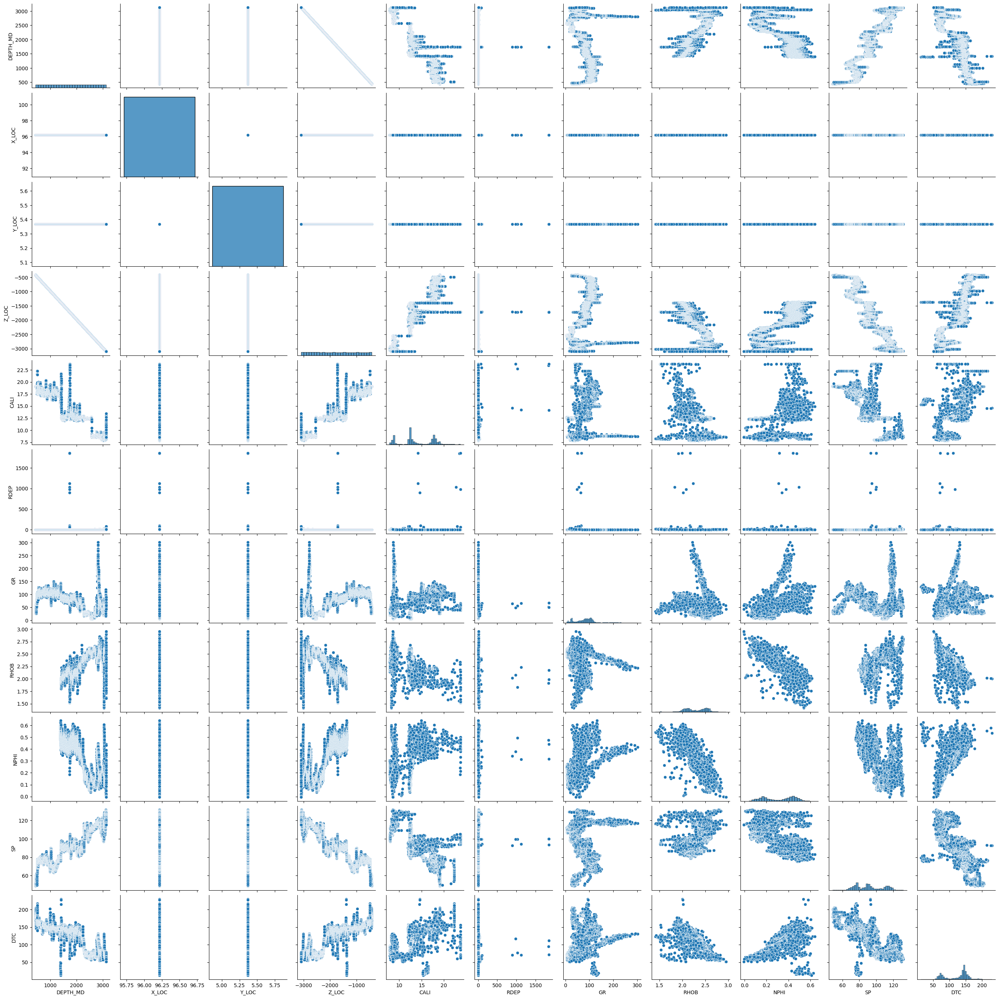

In [126]:
import seaborn as sns

# fig_log = px.scatter_matrix(series_data.data_log)
# fig_log.show()

sns.pairplot(log_well_c1)